Our goal here is to implement an LSTM using pytorch to predict stock prices. We will start by using stock data from a single company and then we will expand it to include data from potentially all companies on the Euronext stock exchange.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable

import sklearn
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

from datetime import datetime

from statistics import mean

import quandl 

%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot')

import numpy as np

import pandas as pd

from tqdm import tqdm

import time 


img_path = r'images'

API_KEY = 'gP-Fy4x24KMfFcRd2eZJ'
quandl.ApiConfig.api_key = API_KEY

if torch.cuda.is_available():
    device = torch.device('cuda:0')
    print('running on the gpu')
else:
    device = torch.device('cpu')
    print('running on the cpu')

running on the gpu


In [2]:
keys = ['ORA', 'TFI'] 
train_set = {}
val_set = {}
test_set = {}
data_set = {}

val_start_date = '2015-01-01'
test_start_date = '2016-12-26'
for key in keys:
    print('Retrieving',  key, 'data')
    train_set[key] = quandl.get(f"XPAR/{key}", collapse = 'daily', end_date = '2015-06-25')
    val_set[key] = quandl.get(f"XPAR/{key}", collapse = 'daily', start_date = val_start_date, end_date = '2016-12-25')
    test_set[key] = quandl.get(f"XPAR/{key}", collapse = 'daily', start_date = test_start_date)    
    data_set[key] = quandl.get(f"XPAR/{key}", collapse = 'daily')


Retrieving ORA data
Retrieving TFI data


In [3]:
train_set[key].head()

,Open,High,Low,Close,Volume,Adjustment Factor,Adjustment Type
Date,,,,,,,
2007-01-02,14.672610,14.770634,14.590063,14.719042,669227.0,NaN,NaN
2007-01-03,14.734520,14.765474,14.584904,14.600382,739760.0,NaN,NaN
2007-01-04,14.595223,14.672610,14.512676,14.636496,455048.0,NaN,NaN
2007-01-05,14.631337,14.724201,14.595223,14.600382,528651.0,NaN,NaN
2007-01-08,14.605541,14.703565,14.430130,14.445607,575215.0,NaN,NaN


In [4]:
drop_list = ['Open', 'High', 'Low', 'Adjustment Factor', 'Adjustment Type']
for key in keys:
    try:
        train_set[key] = train_set[key].drop(drop_list, axis = 1)
        val_set[key] = val_set[key].drop(drop_list, axis = 1)
        test_set[key] = test_set[key].drop(drop_list, axis = 1)
        data_set[key] = data_set[key].drop(drop_list, axis = 1)
    except:
        pass


In [5]:
train_set[key].head()

,Close,Volume
Date,,
2007-01-02,14.719042,669227.0
2007-01-03,14.600382,739760.0
2007-01-04,14.636496,455048.0
2007-01-05,14.600382,528651.0
2007-01-08,14.445607,575215.0


In [6]:
rolling_windows = [5,10,20]

for key in keys:
    for window in rolling_windows:
        train_set[key][f'rolling_{str(window)}'] = data_set[key]['Close'].rolling(window).mean()
        val_set[key][f'rolling_{str(window)}'] = data_set[key]['Close'].rolling(window).mean()
        test_set[key][f'rolling_{str(window)}'] = data_set[key]['Close'].rolling(window).mean()
        data_set[key][f'rolling_{str(window)}'] = data_set[key]['Close'].rolling(window).mean()

for key in keys:
    train_set[key].dropna(inplace = True)    

In [7]:
train_set[key].shape, val_set[key].shape, test_set[key].shape

((2194, 5), (517, 5), (505, 5))

In [8]:
train_set[key]

,Close,Volume,rolling_5,rolling_10,rolling_20
Date,,,,,
2007-01-29,13.496325,1327816.0,13.638717,13.748607,14.130642
2007-01-30,13.522120,923909.0,13.576807,13.699595,14.070795
2007-01-31,13.408619,1205364.0,13.506643,13.653163,14.011207
2007-02-01,13.480847,1266344.0,13.474656,13.618596,13.953425
2007-02-02,13.403460,1017088.0,13.462274,13.579903,13.893579
...,...,...,...,...,...
2015-06-19,13.198640,511389.0,13.163225,13.188706,13.275301
2015-06-22,13.570068,564768.0,13.236647,13.256946,13.279188
2015-06-23,13.837841,404289.0,13.337710,13.339437,13.287610


In [9]:
val_start_date = datetime.strptime('2015-01-01', '%Y-%m-%d')
test_start_date = datetime.strptime('2016-12-26', '%Y-%m-%d')
def plot_close_price(data):
    
    max_value = max(data['Close'])

    fig, ax = plt.subplots(figsize = (10, 5))
    ax.plot(data.index, data['Close'], label = 'Close')
    ax.plot([val_start_date, val_start_date], [0,max_value],'k:', label = 'Validation set start date')
    ax.plot([test_start_date, test_start_date], [0,max_value],'g:', label = 'Test set start date')
    
    
    plt.xticks(rotation = 45)
    ax.legend()
     
    return fig, ax

In [10]:
for key in keys:
    fig, ax = plot_close_price(data_set[key])
    plt.title(f'{key} stock prices')
    plt.show()

<IPython.core.display.Javascript object>

C:\Users\brend\Anaconda3\envs\pytorch\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


<IPython.core.display.Javascript object>

In [11]:
full_train_set = pd.concat([train_set[key] for key in keys], axis=0, join='inner')

In [12]:
full_train_set.shape

(4388, 5)

In [13]:
scaler = MinMaxScaler()
scaler.fit(full_train_set)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [14]:
def create_data(data, sequence_length = 200, output_size = 10):
    
    prices = data['Close']
    data = scaler.transform(data)
    X = []
    y = []
    for i in range(data.shape[0] - sequence_length - output_size):
        _X = data[i:i + sequence_length]
        _y = prices.values[sequence_length + i:sequence_length + output_size + i]
        X.append(_X)
        y.append(_y)
            
    y = torch.Tensor(y)
    X = torch.Tensor(X)
    
    return (X, y)
             

In [15]:
sequence_length = 300
output_size = 10

X_train, y_train =  {}, {}
X_val, y_val =  {}, {}
X_test, y_test =  {}, {}
for key in keys:
    X_train[key], y_train[key] =  create_data(train_set[key], sequence_length = sequence_length, output_size = output_size)
    X_val[key], y_val[key] =  create_data(val_set[key], sequence_length = sequence_length, output_size = output_size)
    X_test[key], y_test[key] =  create_data(test_set[key], sequence_length = sequence_length, output_size = output_size)


In [16]:
X_train[key].shape, y_train[key].shape,X_val[key].shape, y_val[key].shape, X_test[key].shape, y_test[key].shape

(torch.Size([1884, 300, 5]),
 torch.Size([1884, 10]),
 torch.Size([207, 300, 5]),
 torch.Size([207, 10]),
 torch.Size([195, 300, 5]),
 torch.Size([195, 10]))

In [17]:
for key in keys:
    X_train[key], y_train[key] = X_train[key].to(device), y_train[key].to(device)
    X_val[key], y_val[key] = X_val[key].to(device), y_val[key].to(device)
    X_test[key], y_test[key] = X_test[key].to(device), y_test[key].to(device)


In [18]:
train_and_val_set = {}
for key in keys:
    train_and_val_set[key] = pd.concat([train_set[key], val_set[key]], axis=0, join='inner')

In [19]:
X_train_and_val = {}
y_train_and_val = {}
for key in keys:
    X_train_and_val[key], y_train_and_val[key] =  create_data(train_and_val_set[key], 
                                                              sequence_length = sequence_length, 
                                                              output_size = output_size)
    
    X_train_and_val[key] = X_train_and_val[key].to(device)
    y_train_and_val[key] = y_train_and_val[key].to(device)


In [20]:
train_and_val_set[key].shape, X_train_and_val[key].shape, y_train_and_val[key].shape

((2711, 5), torch.Size([2401, 300, 5]), torch.Size([2401, 10]))

In [21]:
class Net(nn.Module):
    
    def __init__(self, input_size = 8, hidden_size = 16, num_layers = 1, batch_first = True, dropout = 0,
                 output_size = 10):
        super().__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.batch_first = batch_first
        self.output_size = output_size
        self.dropout = dropout
        
        #Use LSTM layer since we're dealing with sequential data
        self.rnn = nn.LSTM(self.input_size, self.hidden_size, self.num_layers, batch_first = self.batch_first,
                          dropout = self.dropout)
        #Use a linear layer to determine the size of the output sequence. 
        self.fc = nn.Linear(self.hidden_size, self.output_size) 
        
        
    def forward(self, X):   
        batch_size = X.shape[0]
        seq_len = X.shape[1]
        
        self.h_t = torch.randn(self.num_layers, batch_size, self.hidden_size).to(device)
        self.c_t = torch.randn(self.num_layers, batch_size, self.hidden_size).to(device)
        self.hidden_state = (self.h_t, self.c_t)

        X, self.hidden_state = self.rnn(X, self.hidden_state)
        X = X.reshape(seq_len, batch_size, -1)
        X = self.fc(X[-1])
        
        return X
       

In [22]:
def fwd_pass(X,y,model, train = False):
        
    output = model(X)
    loss = loss_function(output, y)
    
    if train:
        model.zero_grad()
        loss.backward()
        optimiser.step()
        
    return loss
    

In [23]:
def train(model, epochs = 100, hidden_size = 4, final_train = False, batch_size = 32, rolling = 10):
    MODEL_NAME = f'lstm_{int(time.time())}'
    print(MODEL_NAME)
    
    EPOCHS = epochs
    if not final_train:
        X_train_set = torch.cat([X_train[key] for key in keys], dim = 0)
        y_train_set = torch.cat([y_train[key] for key in keys], dim = 0)
        
        
        with open(f'lstm_{hidden_size}_hidden_cells.log', 'a') as f:
            for epoch in range(EPOCHS):           
                train_loss_list = []
                #val_loss_list = [] 
                j= 0
                index_list = range(0, X_train_set.shape[0] - (X_train_set.shape[0] % batch_size) - batch_size, batch_size)
                for i in tqdm(np.random.permutation(index_list)):    
                    train_loss = fwd_pass(X_train_set[i: i + batch_size], y_train_set[i:i+batch_size], model, train = True)
                    train_loss_list.append(train_loss)
                    
                    #Keep track of a rolling average of the training and validation loss
                    if j % rolling == 0:
                        with torch.no_grad():   
                            val_loss_list = []
                            for key in keys:
                                _val_loss = fwd_pass(X_val[key], y_val[key], model, train = False)
                                val_loss_list.append(_val_loss)
                            val_loss = torch.mean(torch.stack(val_loss_list))

                        mean_train_loss = torch.mean(torch.stack(train_loss_list))
                        #mean_val_loss = torch.mean(torch.stack(val_loss_list))
                        
                        f.write(f'{MODEL_NAME},{round(time.time(), 3)}, {round(float(mean_train_loss), 3)}, {round(float(val_loss), 3)}, {epoch}\n')
                        
                        train_loss_list = []
                        #val_loss_list = []
                        
                    j += 1

                print('Epoch:', epoch, 'Training loss:', round(float(mean_train_loss), 3), 
                     'Val loss:', round(float(val_loss), 3))
                       
    else:
        for epoch in range(EPOCHS):
            X_train_and_val_set = torch.cat([X_train_and_val[key] for key in keys], dim = 0)
            y_train_and_val_set = torch.cat([y_train_and_val[key] for key in keys], dim = 0)
            
            loss_list = []
            index_list = range(0, X_train_and_val_set.shape[0] - (X_train_and_val_set.shape[0] % batch_size) - batch_size, batch_size)
            j = 0
            for i in tqdm(np.random.permutation(index_list)): 
                loss = fwd_pass(X_train_and_val_set[i: i + batch_size], y_train_and_val_set[i: i+batch_size], 
                                model, train = True)
                loss_list.append(loss)
            
                if j % rolling == 0:
                    mean_loss = torch.mean(torch.stack(loss_list))
                    loss_list = []
                
                j += 1
            if epoch % 10 == 0:
                print('Epoch:', epoch, 'Training loss:', round(float(mean_loss), 3))
         

In [25]:
hidden_size = 32
batch_size = 4
num_layers = 1
dropout = 0

model = Net(input_size = 5, hidden_size = hidden_size, num_layers = num_layers, dropout = dropout, 
            output_size = output_size).to(device)
loss_function = nn.MSELoss()
optimiser = optim.RMSprop(model.parameters(), lr = 0.0003, alpha=0.99, 
                          eps=1e-08, weight_decay=0, momentum=0, centered=False)
EPOCHS = 201
train(model, hidden_size = hidden_size, epochs = EPOCHS, batch_size = batch_size)

  1%|▋                                                                                 | 8/941 [00:00<00:12, 73.59it/s]

lstm_1580315958


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 0 Training loss: 5.155 Val loss: 11.434


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 1 Training loss: 0.543 Val loss: 3.156


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.88it/s]

Epoch: 2 Training loss: 0.483 Val loss: 0.777


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.16it/s]

Epoch: 3 Training loss: 0.108 Val loss: 0.291


  1%|▉                                                                                | 11/941 [00:00<00:10, 91.91it/s]

Epoch: 4 Training loss: 0.131 Val loss: 0.251


  1%|▊                                                                                | 10/941 [00:00<00:09, 96.41it/s]

Epoch: 5 Training loss: 0.123 Val loss: 0.371


  1%|▊                                                                                | 10/941 [00:00<00:10, 92.84it/s]

Epoch: 6 Training loss: 0.19 Val loss: 0.251


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 7 Training loss: 0.397 Val loss: 0.228


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 8 Training loss: 0.214 Val loss: 0.25


  1%|▊                                                                                 | 9/941 [00:00<00:10, 87.61it/s]

Epoch: 9 Training loss: 0.462 Val loss: 0.254


  1%|▊                                                                                | 10/941 [00:00<00:09, 99.75it/s]

Epoch: 10 Training loss: 0.158 Val loss: 0.343


  1%|▊                                                                                | 10/941 [00:00<00:09, 94.53it/s]

Epoch: 11 Training loss: 0.1 Val loss: 0.213


  1%|▊                                                                                | 10/941 [00:00<00:09, 97.76it/s]

Epoch: 12 Training loss: 0.142 Val loss: 0.23


  1%|▉                                                                                | 11/941 [00:00<00:10, 92.65it/s]

Epoch: 13 Training loss: 0.208 Val loss: 0.397


  1%|▊                                                                                | 10/941 [00:00<00:09, 99.28it/s]

Epoch: 14 Training loss: 0.196 Val loss: 0.265


  1%|▊                                                                                | 10/941 [00:00<00:09, 95.94it/s]

Epoch: 15 Training loss: 0.06 Val loss: 0.264


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.61it/s]

Epoch: 16 Training loss: 0.147 Val loss: 0.236


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 17 Training loss: 0.182 Val loss: 0.257


  1%|▊                                                                                | 10/941 [00:00<00:09, 97.80it/s]

Epoch: 18 Training loss: 0.105 Val loss: 0.207


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 19 Training loss: 0.131 Val loss: 0.327


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.32it/s]

Epoch: 20 Training loss: 0.212 Val loss: 0.216


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.05it/s]

Epoch: 21 Training loss: 0.115 Val loss: 0.194


  1%|▊                                                                                | 10/941 [00:00<00:09, 96.41it/s]

Epoch: 22 Training loss: 0.214 Val loss: 0.197


  1%|▊                                                                                | 10/941 [00:00<00:09, 99.27it/s]

Epoch: 23 Training loss: 0.056 Val loss: 0.189


  1%|▊                                                                                | 10/941 [00:00<00:09, 99.28it/s]

Epoch: 24 Training loss: 0.06 Val loss: 0.216


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.71it/s]

Epoch: 25 Training loss: 0.101 Val loss: 0.21


  1%|▊                                                                                | 10/941 [00:00<00:11, 84.23it/s]

Epoch: 26 Training loss: 0.144 Val loss: 0.238


  1%|▉                                                                                | 11/941 [00:00<00:09, 93.47it/s]

Epoch: 27 Training loss: 0.194 Val loss: 0.185


  1%|▊                                                                                 | 9/941 [00:00<00:10, 85.94it/s]

Epoch: 28 Training loss: 0.1 Val loss: 0.199


  1%|▊                                                                                 | 9/941 [00:00<00:10, 88.44it/s]

Epoch: 29 Training loss: 0.181 Val loss: 0.199


  1%|▊                                                                                 | 9/941 [00:00<00:11, 84.34it/s]

Epoch: 30 Training loss: 0.104 Val loss: 0.215


  1%|▊                                                                                 | 9/941 [00:00<00:11, 82.03it/s]

Epoch: 31 Training loss: 0.187 Val loss: 0.197


  1%|▊                                                                                | 10/941 [00:00<00:10, 92.31it/s]

Epoch: 32 Training loss: 0.114 Val loss: 0.188


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 33 Training loss: 0.188 Val loss: 0.178


  1%|▉                                                                               | 11/941 [00:00<00:09, 100.73it/s]

Epoch: 34 Training loss: 0.141 Val loss: 0.244


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.08it/s]

Epoch: 35 Training loss: 0.139 Val loss: 0.185


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.91it/s]

Epoch: 36 Training loss: 0.077 Val loss: 0.193


  1%|▋                                                                                 | 8/941 [00:00<00:12, 76.40it/s]

Epoch: 37 Training loss: 0.111 Val loss: 0.18


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.75it/s]

Epoch: 38 Training loss: 0.264 Val loss: 0.186


  1%|▋                                                                                 | 8/941 [00:00<00:11, 78.64it/s]

Epoch: 39 Training loss: 0.186 Val loss: 0.205


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 40 Training loss: 0.092 Val loss: 0.184


  1%|▉                                                                                | 11/941 [00:00<00:09, 93.47it/s]

Epoch: 41 Training loss: 0.185 Val loss: 0.203


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.61it/s]

Epoch: 42 Training loss: 0.281 Val loss: 0.223


  1%|▊                                                                                 | 9/941 [00:00<00:11, 81.30it/s]

Epoch: 43 Training loss: 0.136 Val loss: 0.269


  1%|▊                                                                                | 10/941 [00:00<00:10, 91.99it/s]

Epoch: 44 Training loss: 0.096 Val loss: 0.189


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.11it/s]

Epoch: 45 Training loss: 0.099 Val loss: 0.184


  1%|▊                                                                                 | 9/941 [00:00<00:10, 89.26it/s]

Epoch: 46 Training loss: 0.191 Val loss: 0.18


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 47 Training loss: 0.174 Val loss: 0.178


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.52it/s]

Epoch: 48 Training loss: 0.09 Val loss: 0.177


  1%|▋                                                                                 | 8/941 [00:00<00:12, 76.39it/s]

Epoch: 49 Training loss: 0.132 Val loss: 0.177


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 50 Training loss: 0.114 Val loss: 0.227


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.75it/s]

Epoch: 51 Training loss: 0.096 Val loss: 0.182


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.13it/s]

Epoch: 52 Training loss: 0.091 Val loss: 0.18


  1%|▉                                                                               | 11/941 [00:00<00:09, 101.19it/s]

Epoch: 53 Training loss: 0.067 Val loss: 0.174


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 54 Training loss: 0.116 Val loss: 0.189


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.61it/s]

Epoch: 55 Training loss: 0.208 Val loss: 0.19


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.91it/s]

Epoch: 56 Training loss: 0.164 Val loss: 0.254


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 57 Training loss: 0.19 Val loss: 0.237


  1%|▊                                                                                 | 9/941 [00:00<00:10, 88.47it/s]

Epoch: 58 Training loss: 0.076 Val loss: 0.184


  1%|▊                                                                                | 10/941 [00:00<00:09, 96.41it/s]

Epoch: 59 Training loss: 0.241 Val loss: 0.268


  1%|▊                                                                                 | 9/941 [00:00<00:11, 82.73it/s]

Epoch: 60 Training loss: 0.172 Val loss: 0.183


  1%|▉                                                                                | 11/941 [00:00<00:09, 99.36it/s]

Epoch: 61 Training loss: 0.219 Val loss: 0.264


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 62 Training loss: 0.113 Val loss: 0.213


  1%|▉                                                                               | 11/941 [00:00<00:09, 101.19it/s]

Epoch: 63 Training loss: 0.071 Val loss: 0.185


  2%|█▍                                                                               | 17/941 [00:00<00:10, 85.02it/s]

Epoch: 64 Training loss: 0.109 Val loss: 0.174


  1%|▉                                                                               | 11/941 [00:00<00:09, 103.08it/s]

Epoch: 65 Training loss: 0.142 Val loss: 0.175


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 66 Training loss: 0.102 Val loss: 0.245


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.61it/s]

Epoch: 67 Training loss: 0.08 Val loss: 0.173


  1%|▉                                                                               | 11/941 [00:00<00:09, 101.25it/s]

Epoch: 68 Training loss: 0.216 Val loss: 0.174


  1%|▊                                                                                | 10/941 [00:00<00:09, 95.49it/s]

Epoch: 69 Training loss: 0.118 Val loss: 0.185


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.75it/s]

Epoch: 70 Training loss: 0.076 Val loss: 0.182


  1%|▉                                                                               | 11/941 [00:00<00:09, 103.08it/s]

Epoch: 71 Training loss: 0.092 Val loss: 0.186


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.12it/s]

Epoch: 72 Training loss: 0.194 Val loss: 0.172


  1%|▊                                                                                | 10/941 [00:00<00:10, 92.81it/s]

Epoch: 73 Training loss: 0.132 Val loss: 0.192


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.12it/s]

Epoch: 74 Training loss: 0.102 Val loss: 0.174


  1%|▊                                                                                 | 9/941 [00:00<00:10, 88.47it/s]

Epoch: 75 Training loss: 0.127 Val loss: 0.214


  1%|▉                                                                                | 11/941 [00:00<00:09, 99.15it/s]

Epoch: 76 Training loss: 0.164 Val loss: 0.219


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.08it/s]

Epoch: 77 Training loss: 0.097 Val loss: 0.187


  1%|▊                                                                                | 10/941 [00:00<00:09, 98.31it/s]

Epoch: 78 Training loss: 0.312 Val loss: 0.179


  1%|▊                                                                                | 10/941 [00:00<00:09, 93.71it/s]

Epoch: 79 Training loss: 0.106 Val loss: 0.171


  1%|▉                                                                               | 11/941 [00:00<00:08, 104.05it/s]

Epoch: 80 Training loss: 0.149 Val loss: 0.313


  1%|▊                                                                                | 10/941 [00:00<00:09, 95.46it/s]

Epoch: 81 Training loss: 0.111 Val loss: 0.176


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.64it/s]

Epoch: 82 Training loss: 0.246 Val loss: 0.184


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.13it/s]

Epoch: 83 Training loss: 0.139 Val loss: 0.209


  1%|▉                                                                               | 11/941 [00:00<00:08, 104.05it/s]

Epoch: 84 Training loss: 0.097 Val loss: 0.17


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.08it/s]

Epoch: 85 Training loss: 0.188 Val loss: 0.18


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.09it/s]

Epoch: 86 Training loss: 0.132 Val loss: 0.194


  1%|▉                                                                               | 11/941 [00:00<00:09, 100.27it/s]

Epoch: 87 Training loss: 0.091 Val loss: 0.229


  1%|▊                                                                                | 10/941 [00:00<00:09, 97.35it/s]

Epoch: 88 Training loss: 0.066 Val loss: 0.215


  1%|▊                                                                                 | 9/941 [00:00<00:10, 87.65it/s]

Epoch: 89 Training loss: 0.099 Val loss: 0.25


  1%|▉                                                                                | 11/941 [00:00<00:09, 99.40it/s]

Epoch: 90 Training loss: 0.048 Val loss: 0.182


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.91it/s]

Epoch: 91 Training loss: 0.118 Val loss: 0.181


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.91it/s]

Epoch: 92 Training loss: 0.113 Val loss: 0.179


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.91it/s]

Epoch: 93 Training loss: 0.123 Val loss: 0.177


  1%|▉                                                                                | 11/941 [00:00<00:09, 99.37it/s]

Epoch: 94 Training loss: 0.112 Val loss: 0.193


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.75it/s]

Epoch: 95 Training loss: 0.255 Val loss: 0.261


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.61it/s]

Epoch: 96 Training loss: 0.148 Val loss: 0.181


  1%|▊                                                                                | 10/941 [00:00<00:10, 92.80it/s]

Epoch: 97 Training loss: 0.125 Val loss: 0.18


  1%|▉                                                                               | 11/941 [00:00<00:09, 103.04it/s]

Epoch: 98 Training loss: 0.045 Val loss: 0.175


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.57it/s]

Epoch: 99 Training loss: 0.079 Val loss: 0.179


  2%|█▌                                                                               | 18/941 [00:00<00:10, 88.82it/s]

Epoch: 100 Training loss: 0.099 Val loss: 0.235


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 101 Training loss: 0.114 Val loss: 0.181


  2%|█▌                                                                               | 18/941 [00:00<00:11, 83.43it/s]

Epoch: 102 Training loss: 0.121 Val loss: 0.254


  1%|▉                                                                                | 11/941 [00:00<00:10, 92.93it/s]

Epoch: 103 Training loss: 0.276 Val loss: 0.17


  1%|▊                                                                                 | 9/941 [00:00<00:11, 82.79it/s]

Epoch: 104 Training loss: 0.165 Val loss: 0.175


  1%|▉                                                                                | 11/941 [00:00<00:09, 93.50it/s]

Epoch: 105 Training loss: 0.108 Val loss: 0.172


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.05it/s]

Epoch: 106 Training loss: 0.091 Val loss: 0.215


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.50it/s]

Epoch: 107 Training loss: 0.148 Val loss: 0.192


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 108 Training loss: 0.121 Val loss: 0.174


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.91it/s]

Epoch: 109 Training loss: 0.081 Val loss: 0.19


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.12it/s]

Epoch: 110 Training loss: 0.164 Val loss: 0.172


  1%|▊                                                                                | 10/941 [00:00<00:09, 98.30it/s]

Epoch: 111 Training loss: 0.131 Val loss: 0.184


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.08it/s]

Epoch: 112 Training loss: 0.23 Val loss: 0.174


  1%|▊                                                                                | 10/941 [00:00<00:09, 96.41it/s]

Epoch: 113 Training loss: 0.197 Val loss: 0.222


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.08it/s]

Epoch: 114 Training loss: 0.217 Val loss: 0.173


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.05it/s]

Epoch: 115 Training loss: 0.097 Val loss: 0.195


  1%|▉                                                                                | 11/941 [00:00<00:09, 98.48it/s]

Epoch: 116 Training loss: 0.113 Val loss: 0.172


  1%|▉                                                                               | 11/941 [00:00<00:09, 100.22it/s]

Epoch: 117 Training loss: 0.281 Val loss: 0.175


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.27it/s]

Epoch: 118 Training loss: 0.137 Val loss: 0.174


  1%|▉                                                                                | 11/941 [00:00<00:09, 96.75it/s]

Epoch: 119 Training loss: 0.116 Val loss: 0.234


  1%|▉                                                                               | 11/941 [00:00<00:09, 102.15it/s]

Epoch: 120 Training loss: 0.062 Val loss: 0.19


  1%|▊                                                                                | 10/941 [00:00<00:09, 96.41it/s]

Epoch: 121 Training loss: 0.127 Val loss: 0.211


  1%|▊                                                                                | 10/941 [00:00<00:09, 93.71it/s]

Epoch: 122 Training loss: 0.09 Val loss: 0.184


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.09it/s]

Epoch: 123 Training loss: 0.111 Val loss: 0.196


  1%|▊                                                                                | 10/941 [00:00<00:09, 98.30it/s]

Epoch: 124 Training loss: 0.068 Val loss: 0.175


  1%|▊                                                                                | 10/941 [00:00<00:09, 97.35it/s]

Epoch: 125 Training loss: 0.09 Val loss: 0.176


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.23it/s]

Epoch: 126 Training loss: 0.181 Val loss: 0.189


  1%|▉                                                                                | 11/941 [00:00<00:09, 93.86it/s]

Epoch: 127 Training loss: 0.047 Val loss: 0.174


  1%|▊                                                                                 | 9/941 [00:00<00:10, 85.11it/s]

Epoch: 128 Training loss: 0.097 Val loss: 0.173


  1%|▉                                                                                | 11/941 [00:00<00:09, 94.24it/s]

Epoch: 129 Training loss: 0.206 Val loss: 0.18


  1%|▉                                                                                | 11/941 [00:00<00:09, 97.60it/s]

Epoch: 130 Training loss: 0.116 Val loss: 0.176


  1%|▊                                                                                | 10/941 [00:00<00:09, 98.31it/s]

Epoch: 131 Training loss: 0.094 Val loss: 0.178


  1%|▊                                                                                | 10/941 [00:00<00:09, 95.50it/s]

Epoch: 132 Training loss: 0.111 Val loss: 0.174


  1%|▊                                                                                | 10/941 [00:00<00:09, 96.41it/s]

Epoch: 133 Training loss: 0.148 Val loss: 0.177


  2%|█▌                                                                               | 18/941 [00:00<00:10, 84.80it/s]

Epoch: 134 Training loss: 0.21 Val loss: 0.195


  1%|▊                                                                                 | 9/941 [00:00<00:10, 88.02it/s]

Epoch: 135 Training loss: 0.094 Val loss: 0.195


  1%|▊                                                                                 | 9/941 [00:00<00:11, 82.80it/s]

Epoch: 136 Training loss: 0.108 Val loss: 0.173


  1%|▉                                                                                | 11/941 [00:00<00:09, 95.87it/s]

Epoch: 137 Training loss: 0.057 Val loss: 0.176


  1%|▊                                                                                | 10/941 [00:00<00:10, 89.53it/s]

Epoch: 138 Training loss: 0.24 Val loss: 0.228


  1%|▊                                                                                | 10/941 [00:00<00:10, 90.67it/s]

Epoch: 139 Training loss: 0.082 Val loss: 0.178


  1%|▊                                                                                 | 9/941 [00:00<00:10, 88.60it/s]

Epoch: 140 Training loss: 0.27 Val loss: 0.194


  1%|▊                                                                                 | 9/941 [00:00<00:10, 88.51it/s]

Epoch: 141 Training loss: 0.126 Val loss: 0.217


 21%|████████████████▋                                                               | 196/941 [00:02<00:08, 92.42it/s]


KeyboardInterrupt: 

In [26]:
log = pd.read_csv(f'lstm_{hidden_size}_hidden_cells.log', header = None)
log.columns = ['model_name','time', 'train_loss', 'val_loss', 'epoch']
log = log[ log['model_name'] == list(log['model_name'])[-1] ]
log.head(10)

,model_name,time,train_loss,val_loss,epoch
15102,lstm_1580315958,1.580316e+09,80.534,110.677,0
15103,lstm_1580315958,1.580316e+09,59.752,106.663,0
15104,lstm_1580315958,1.580316e+09,49.472,96.684,0
15105,lstm_1580315958,1.580316e+09,56.025,86.355,0
15106,lstm_1580315958,1.580316e+09,50.266,80.427,0
15107,lstm_1580315958,1.580316e+09,41.915,75.894,0
15108,lstm_1580315958,1.580316e+09,41.585,72.147,0
15109,lstm_1580315958,1.580316e+09,43.540,68.844,0
15110,lstm_1580315958,1.580316e+09,36.071,66.210,0
15111,lstm_1580315958,1.580316e+09,27.642,63.966,0


In [28]:
def plot_learning_curves():
    fig, ax = plt.subplots(figsize = (8,5))
    
#     ax.plot(range(10, EPOCHS), train_loss[10:], label = 'Training loss', color = 'red')
#     ax.plot(range(10, EPOCHS), val_loss[10:], label = 'Validation loss', color = 'blue')

    ax.plot(log['time'][50:], log['train_loss'][50:], label = 'Training loss', color = 'red')
    ax.plot(log['time'][50:], log['val_loss'][50:], label = 'Val loss', color = 'blue')
    
    plt.title('Learning curves')
    plt.legend()
    plt.show()
    
    

<IPython.core.display.Javascript object>


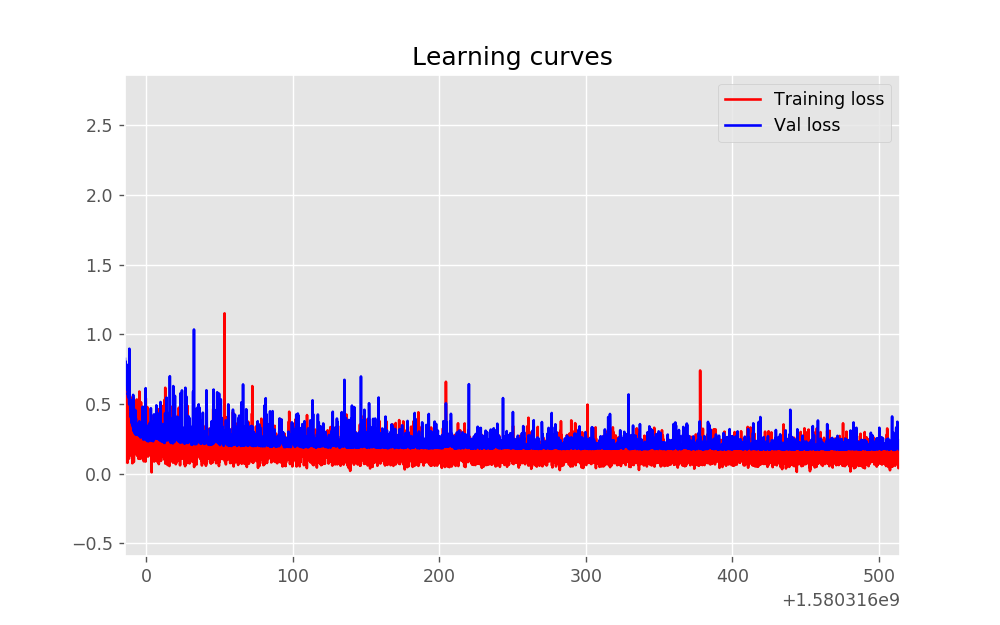

In [29]:
plot_learning_curves()

Now we retrain on the full training and validation set.

In [31]:
model = Net(input_size = 5, hidden_size = hidden_size, num_layers = num_layers, dropout = dropout, 
            output_size = output_size).to(device)
loss_function = nn.MSELoss()
optimiser = optim.RMSprop(model.parameters(), lr = 0.0003, alpha=0.99, 
                          eps=1e-08, weight_decay=0, momentum=0, centered=False)
train(model, epochs = 131, hidden_size = hidden_size, final_train = True, batch_size = batch_size)

  1%|▌                                                                                | 9/1199 [00:00<00:13, 86.77it/s]

lstm_1580317456


  1%|▋                                                                               | 11/1199 [00:00<00:12, 98.51it/s]

Epoch: 0 Training loss: 1.489


  1%|▊                                                                              | 12/1199 [00:00<00:10, 114.56it/s]

Epoch: 10 Training loss: 0.123


  1%|▊                                                                              | 12/1199 [00:00<00:09, 119.13it/s]

Epoch: 20 Training loss: 0.092


  1%|▊                                                                              | 12/1199 [00:00<00:10, 110.39it/s]

Epoch: 30 Training loss: 0.153


  1%|▊                                                                              | 12/1199 [00:00<00:10, 112.45it/s]

Epoch: 40 Training loss: 0.137


  1%|▊                                                                              | 12/1199 [00:00<00:10, 115.13it/s]

Epoch: 50 Training loss: 0.071


  1%|▊                                                                              | 12/1199 [00:00<00:10, 114.59it/s]

Epoch: 60 Training loss: 0.143


  2%|█▎                                                                              | 20/1199 [00:00<00:13, 84.72it/s]

Epoch: 70 Training loss: 0.197


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1148/1199 [00:10<00:00, 98.37it/s]

KeyboardInterrupt: 

Now we evaluate on the test set.

In [32]:
y_pred = {}
loss = {}

for key in keys:
    with torch.no_grad():
        y_pred[key] = model(X_test[key])
        loss[key] = loss_function(y_pred[key], y_test[key])

    print(f'{key} test loss:', round(float(loss[key]), 3))

ORA test loss: 0.114
TFI test loss: 0.139


In [34]:
def plot_predicted_price(key, i):
    
    #fig, ax = plot_close_price(data_set[key])
    fig, ax = plt.subplots()
    with torch.no_grad():
        y_pred = model(X_test[key]).cpu()
    ax.plot(test_set[key].index.values[sequence_length + i:sequence_length + output_size + i], y_pred[i], 
            color = 'blue', label = 'Predicted price')
    ax.plot(test_set[key].index.values[sequence_length + i:sequence_length + output_size + i], 
            [test_set[key]['Close'][date] for date in test_set[key].index.values[sequence_length + i:sequence_length + output_size + i]], 
            color = 'red', label = 'Close Price')
    
    plt.legend()
    plt.xticks(rotation = 45)
    plt.title(f'{key} stock prices')
    
    return fig, ax
    
    

<IPython.core.display.Javascript object>


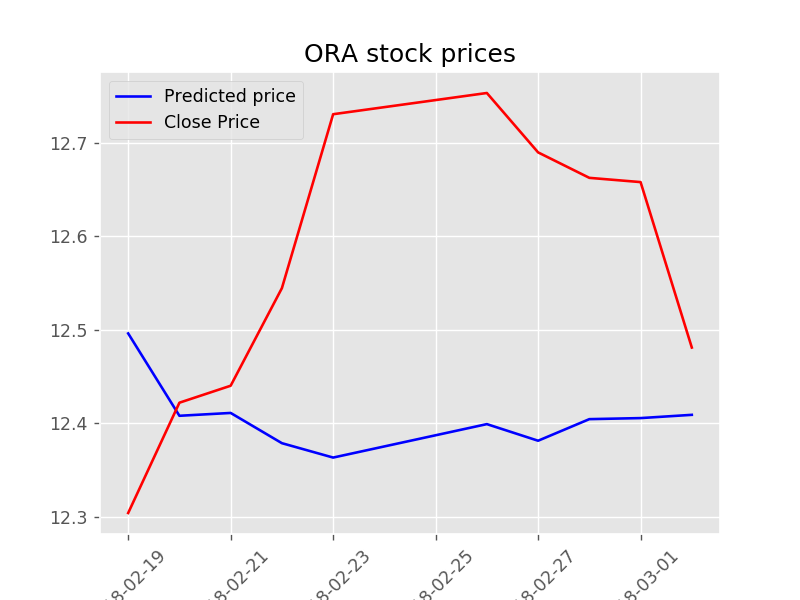

<IPython.core.display.Javascript object>


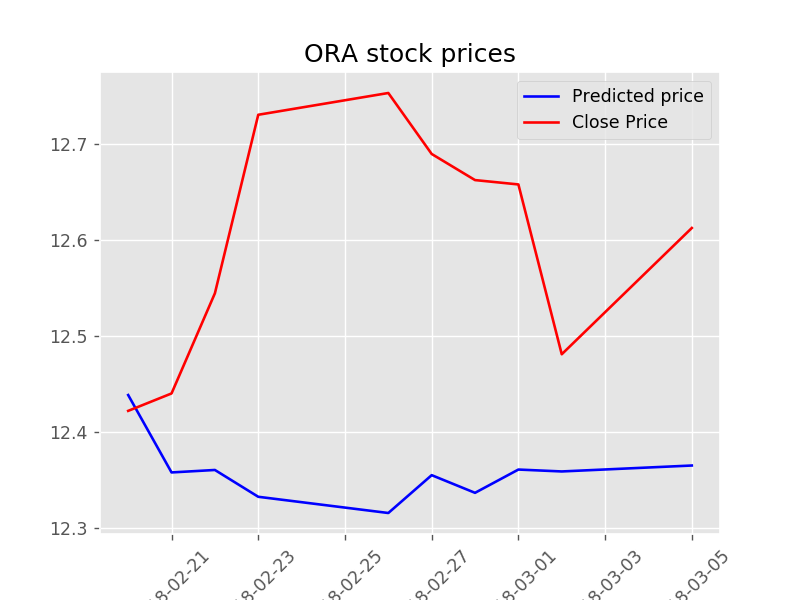

<IPython.core.display.Javascript object>


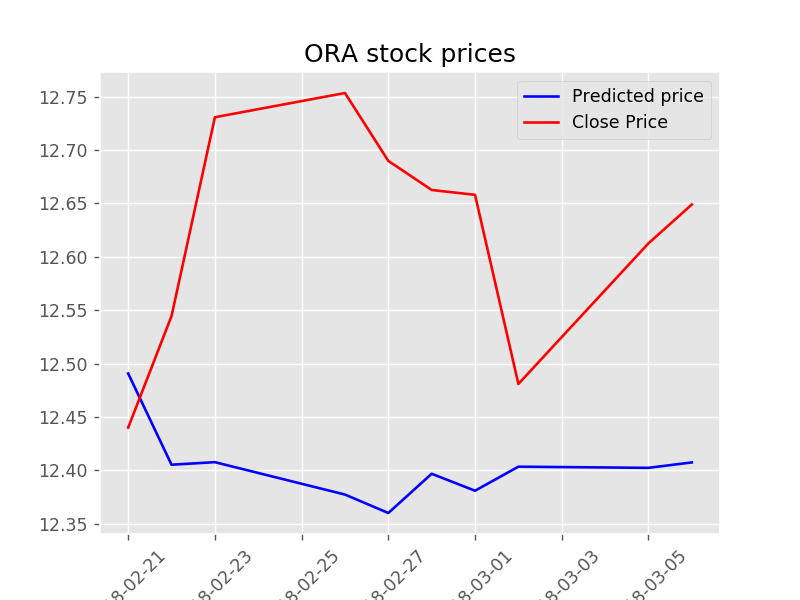

<IPython.core.display.Javascript object>


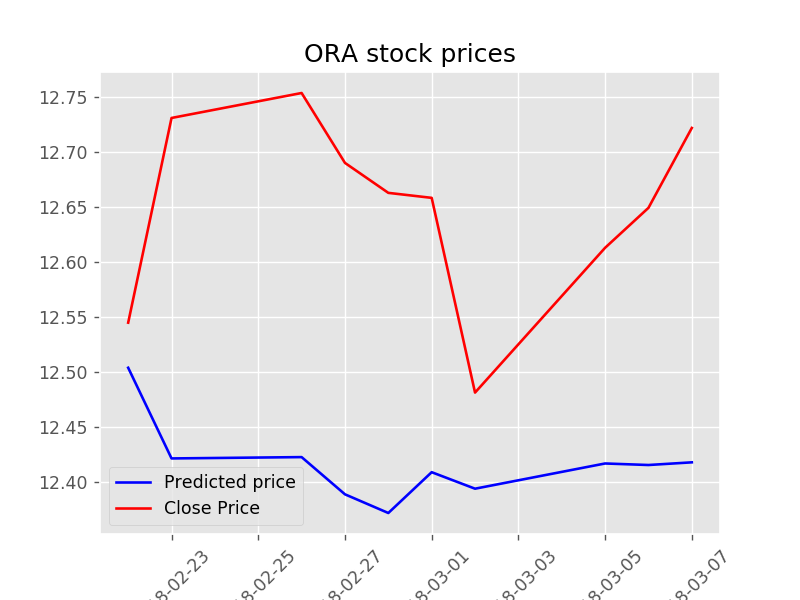

<IPython.core.display.Javascript object>


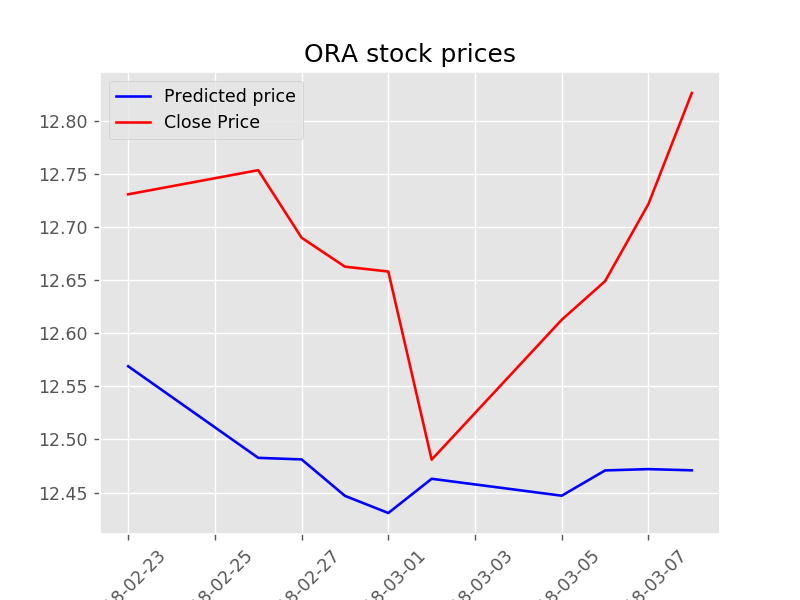

<IPython.core.display.Javascript object>


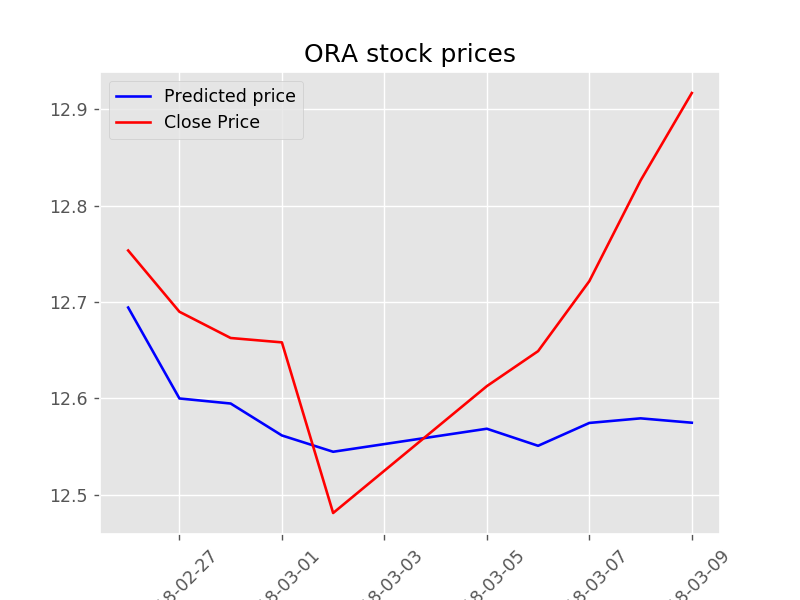

<IPython.core.display.Javascript object>


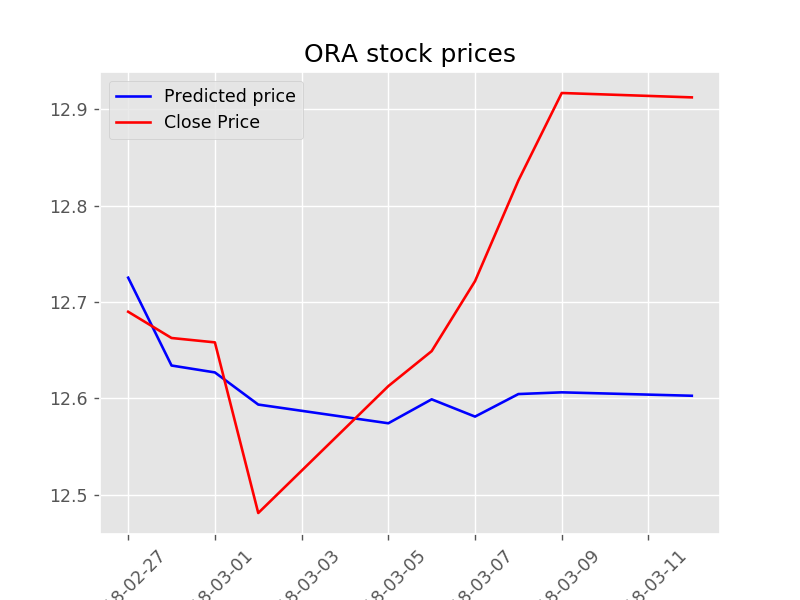

<IPython.core.display.Javascript object>


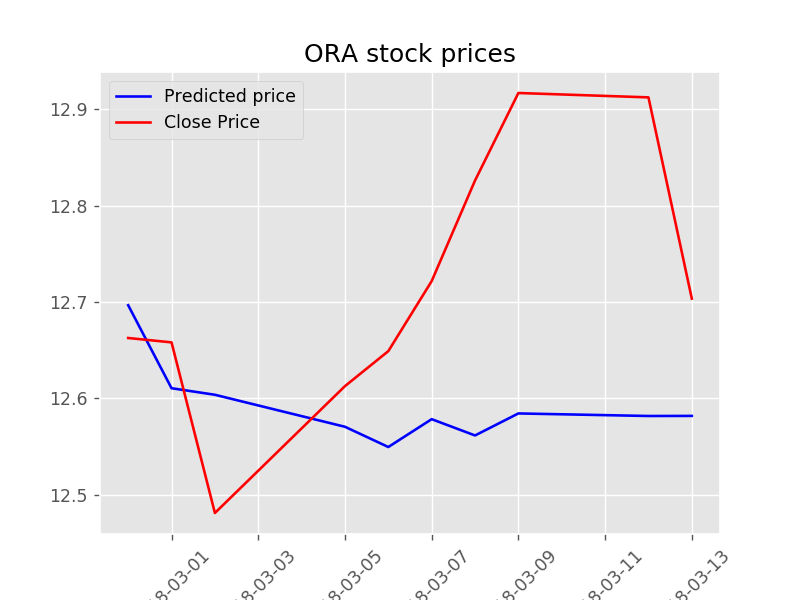

<IPython.core.display.Javascript object>


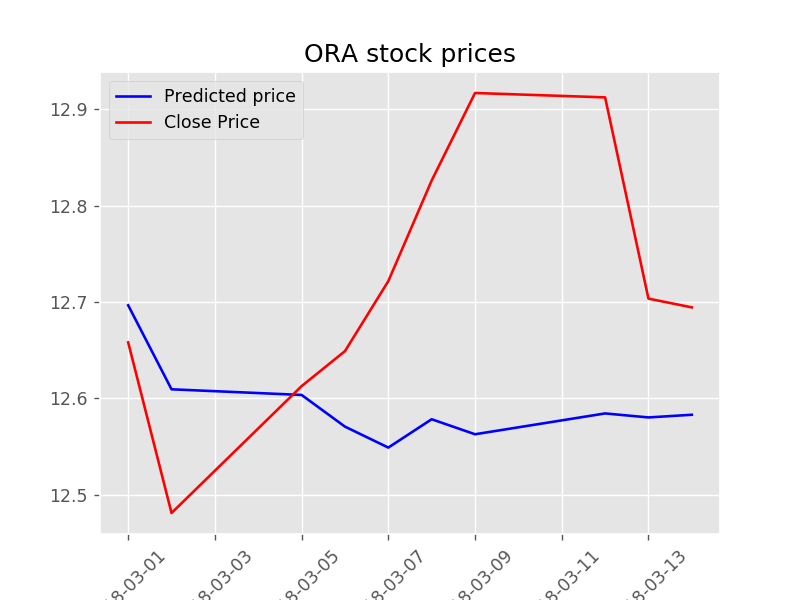

<IPython.core.display.Javascript object>


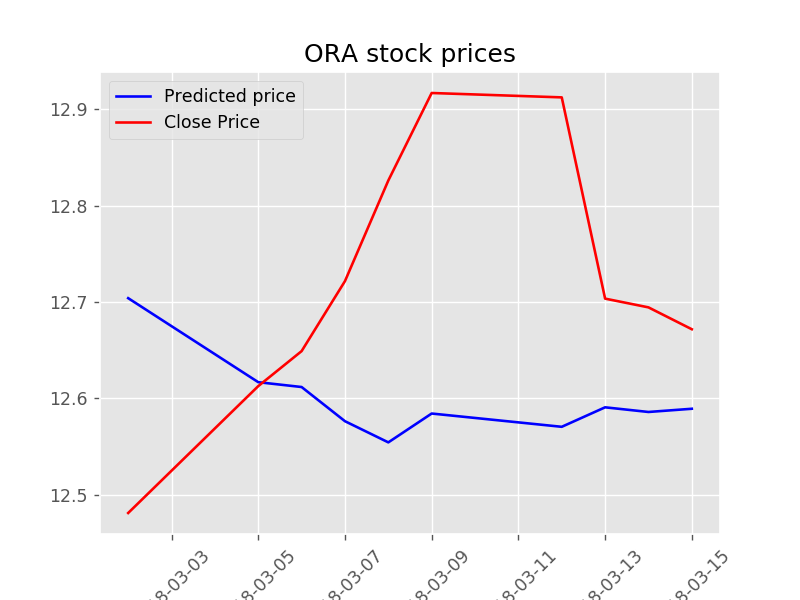

<IPython.core.display.Javascript object>


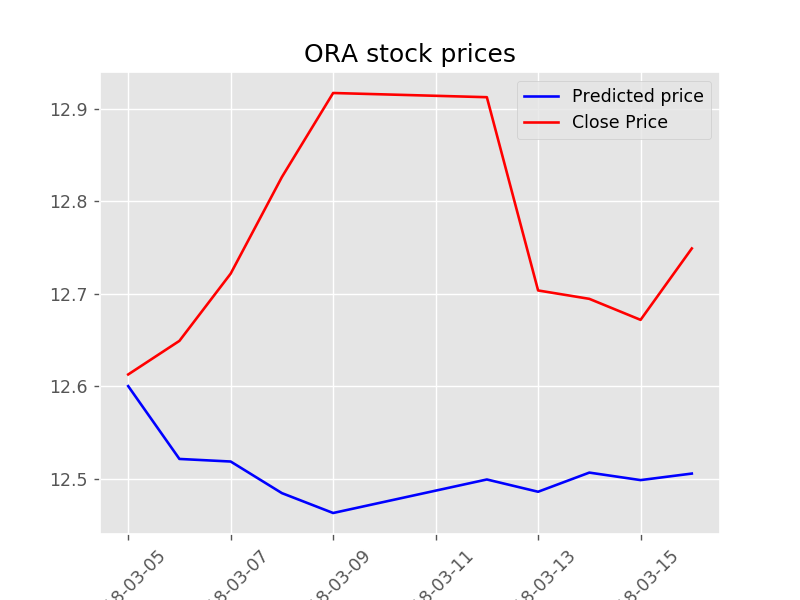

<IPython.core.display.Javascript object>


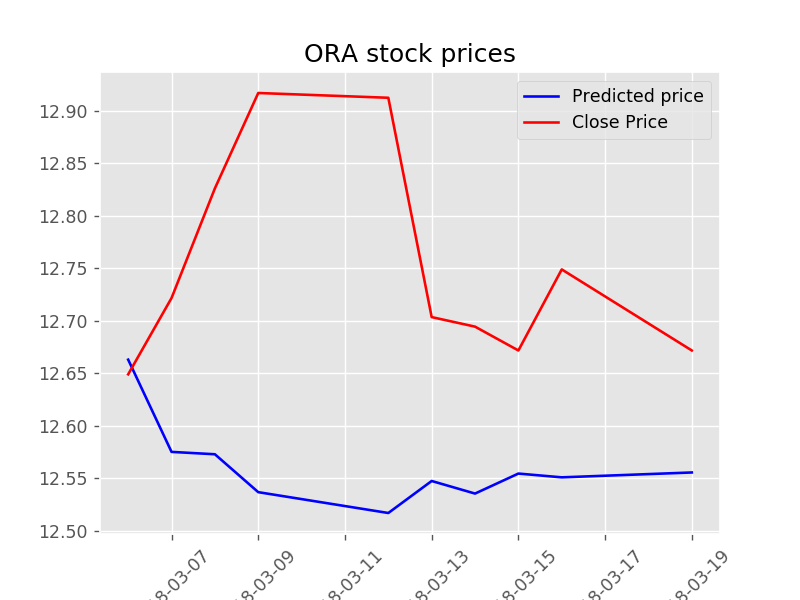

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

C:\Users\brend\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


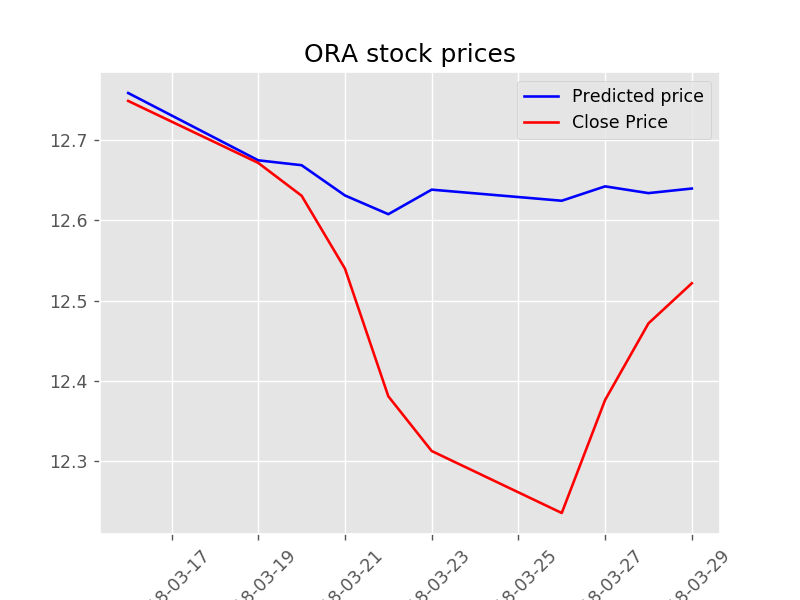

<IPython.core.display.Javascript object>


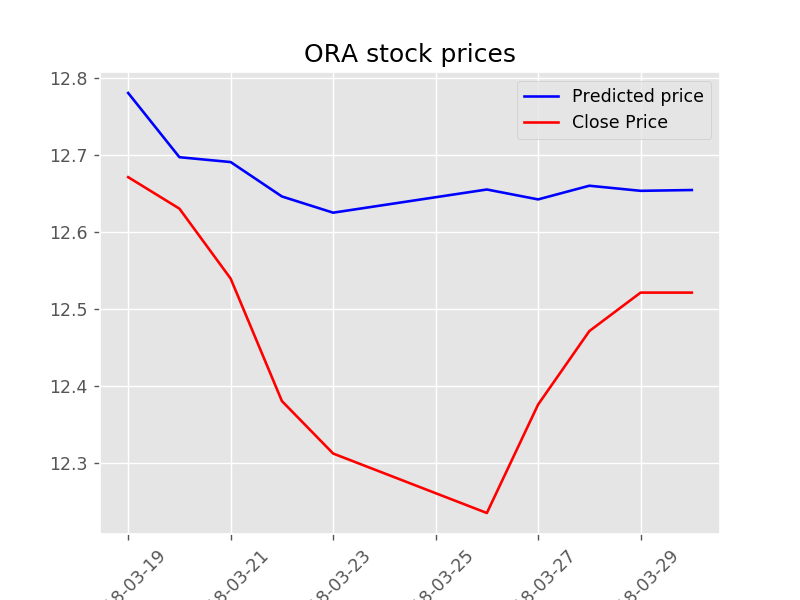

<IPython.core.display.Javascript object>


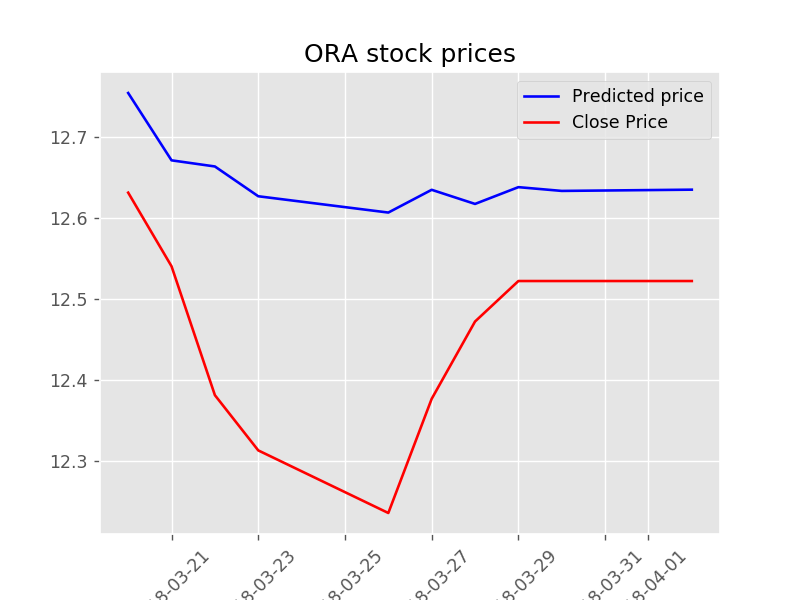

<IPython.core.display.Javascript object>


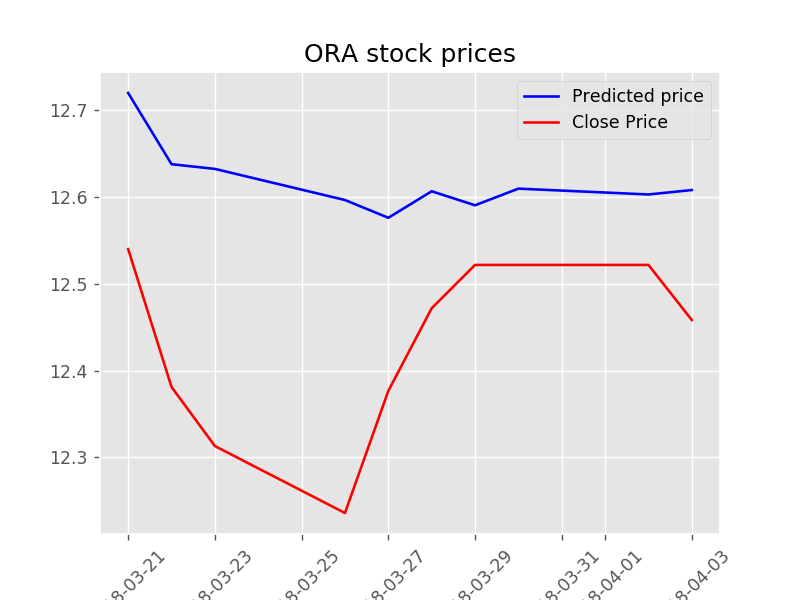

<IPython.core.display.Javascript object>


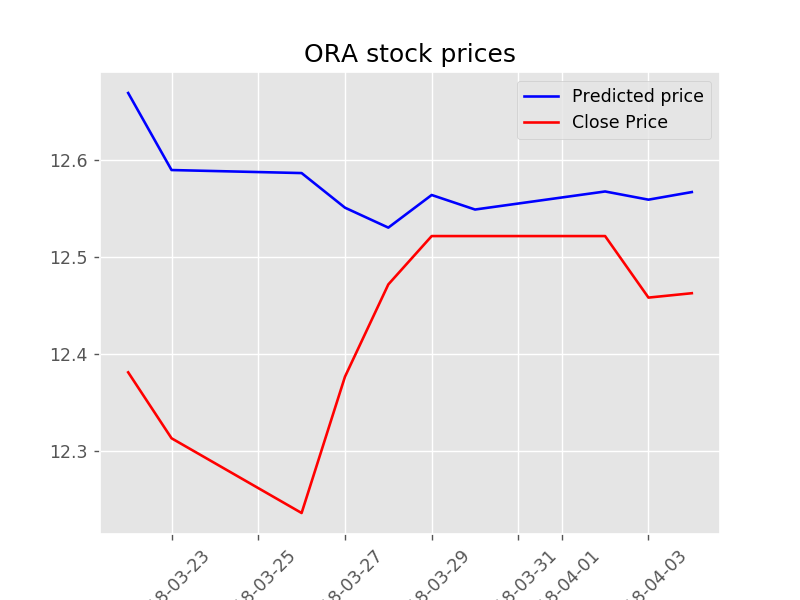

<IPython.core.display.Javascript object>


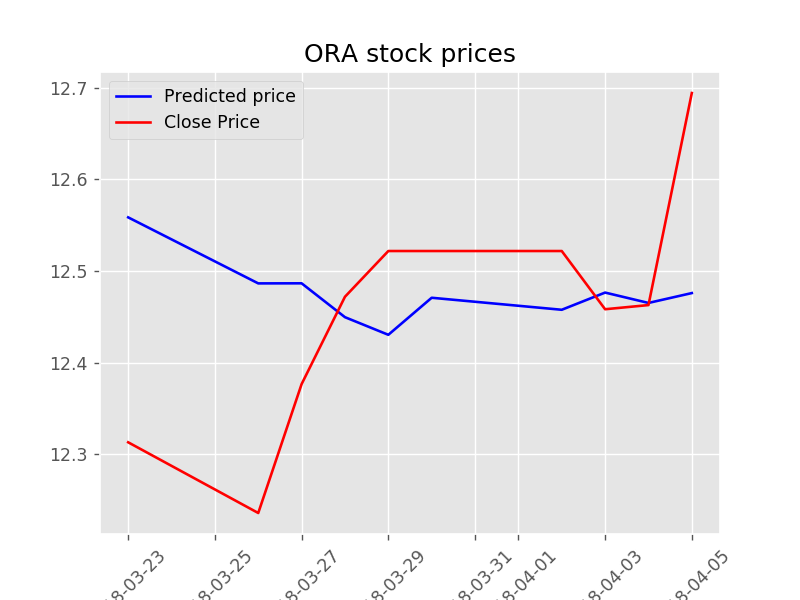

<IPython.core.display.Javascript object>


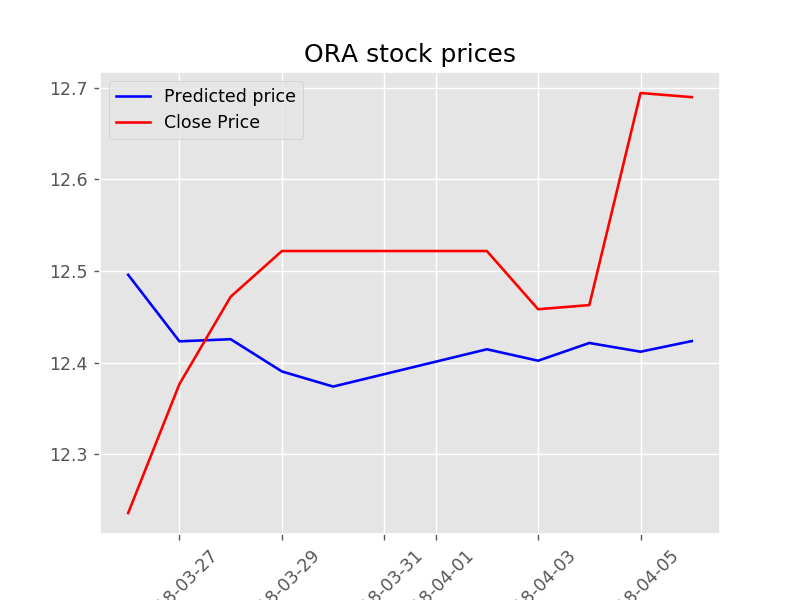

<IPython.core.display.Javascript object>


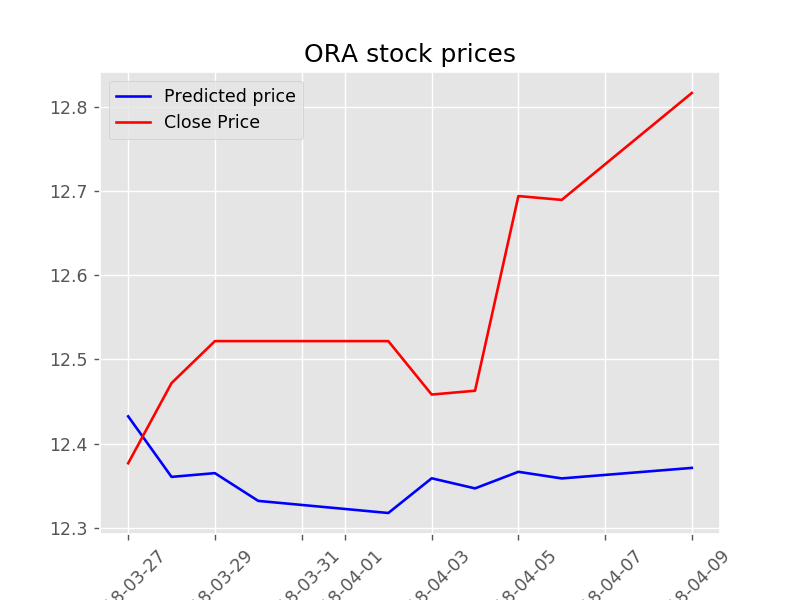

<IPython.core.display.Javascript object>


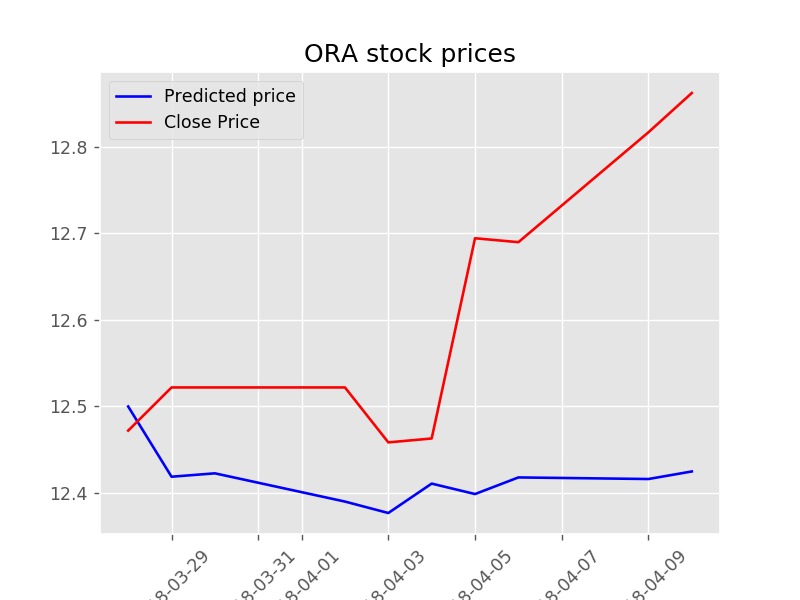

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


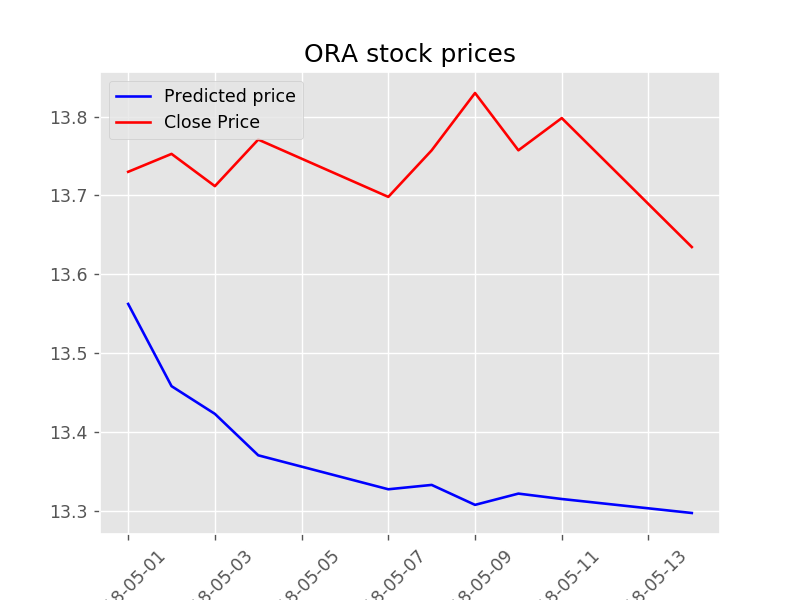

<IPython.core.display.Javascript object>


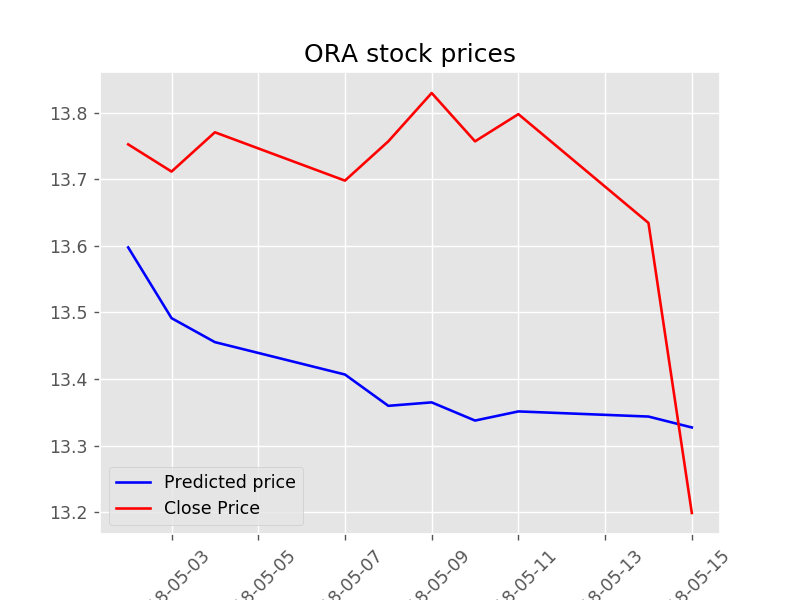

<IPython.core.display.Javascript object>


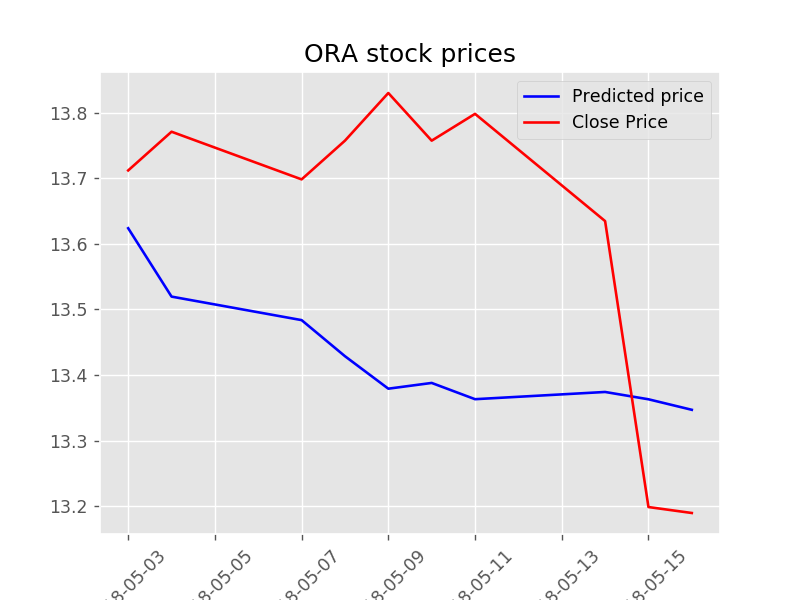

<IPython.core.display.Javascript object>


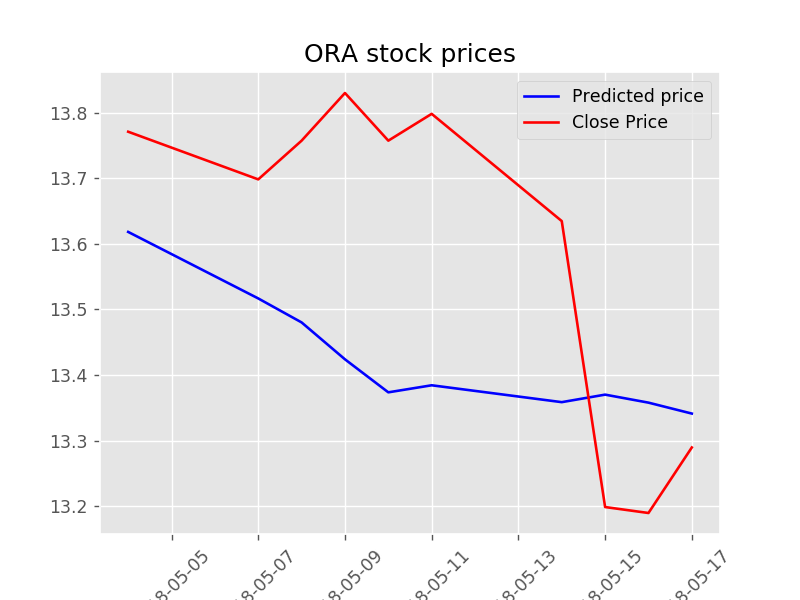

<IPython.core.display.Javascript object>


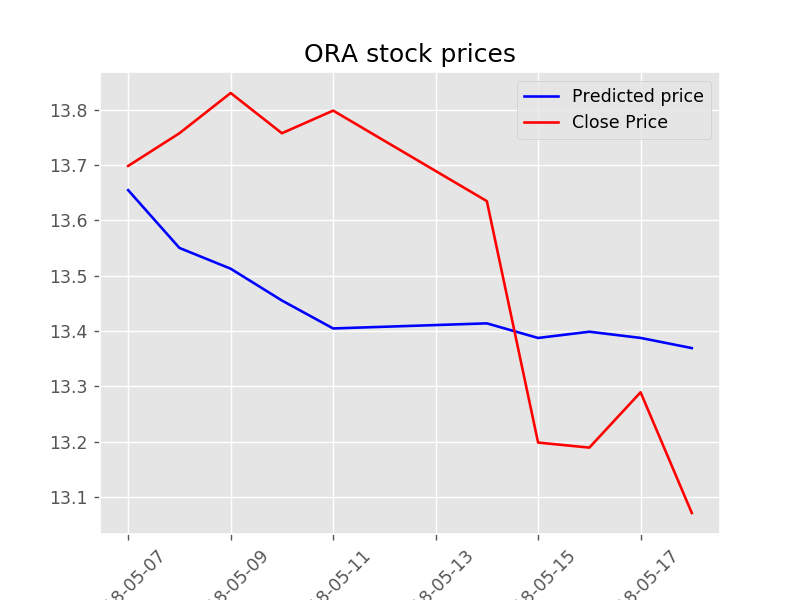

<IPython.core.display.Javascript object>


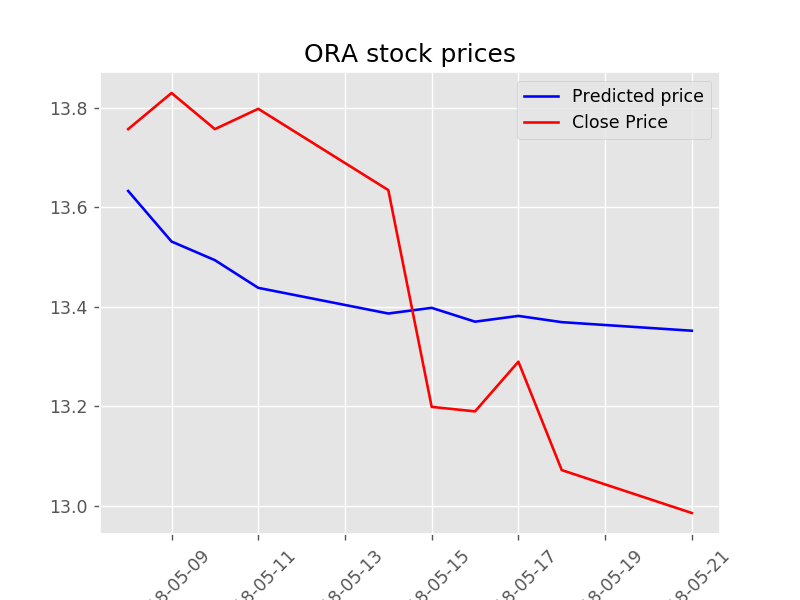

<IPython.core.display.Javascript object>


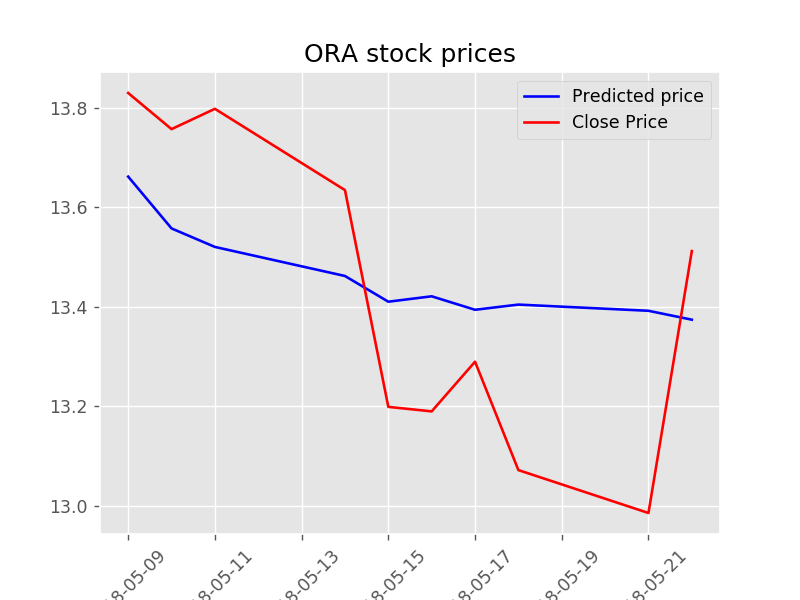

<IPython.core.display.Javascript object>


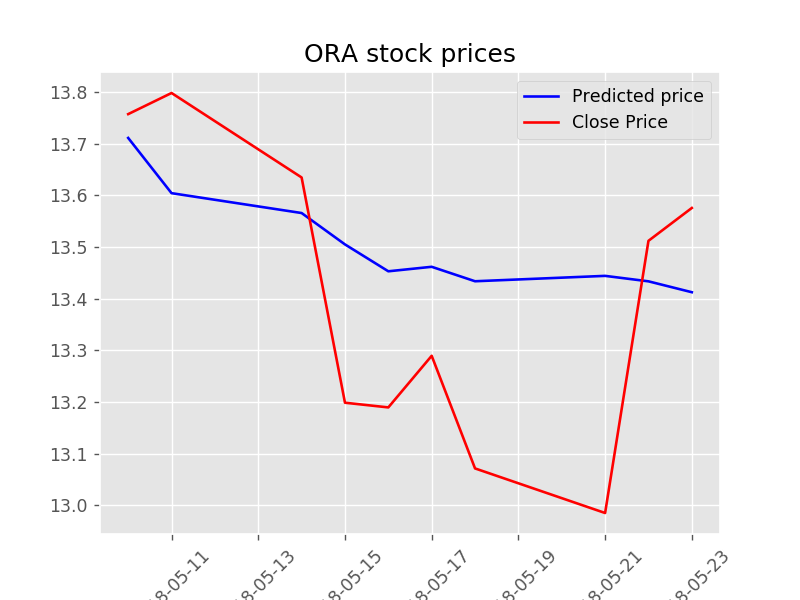

<IPython.core.display.Javascript object>


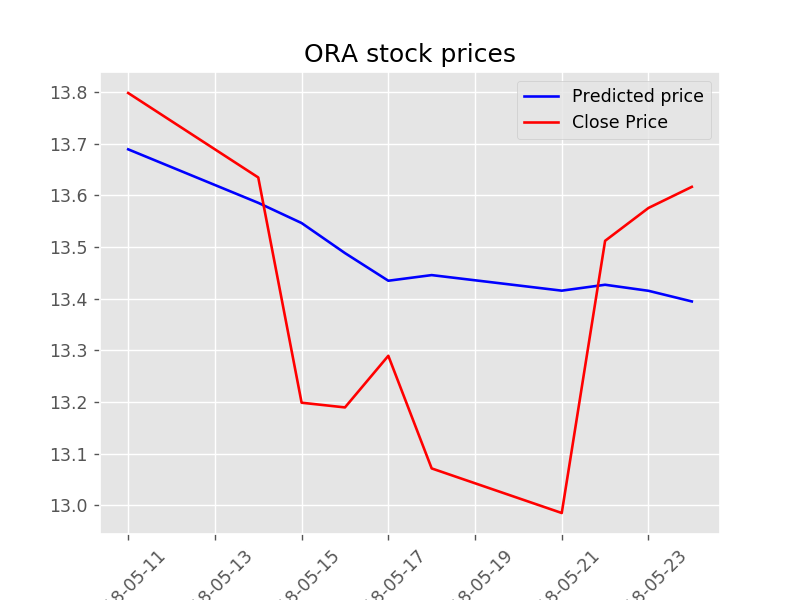

<IPython.core.display.Javascript object>


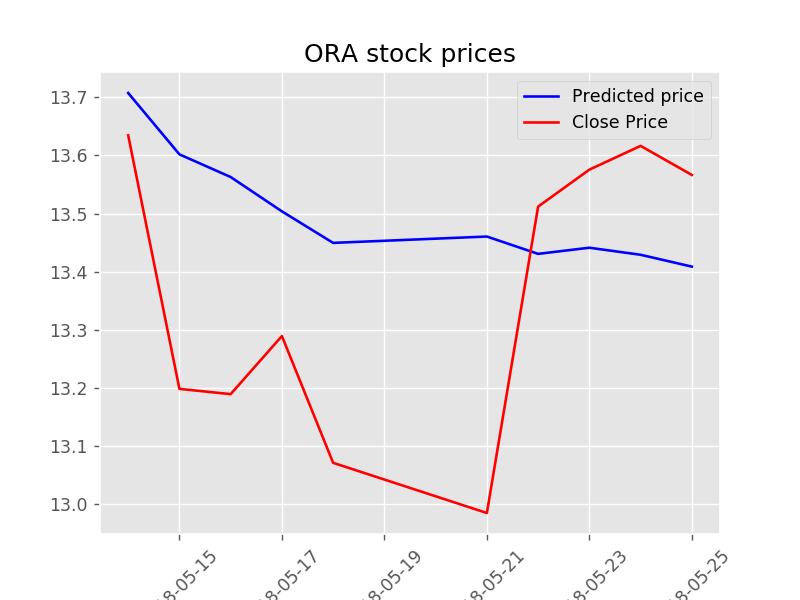

<IPython.core.display.Javascript object>


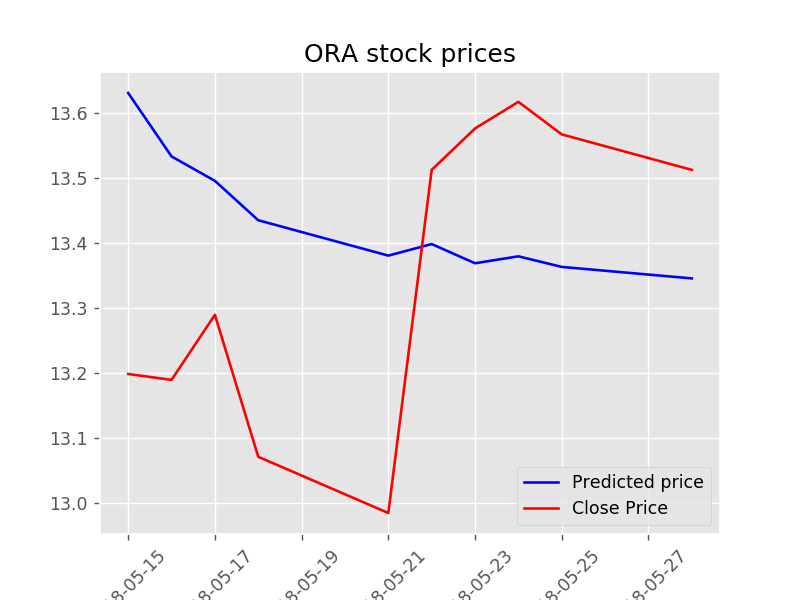

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


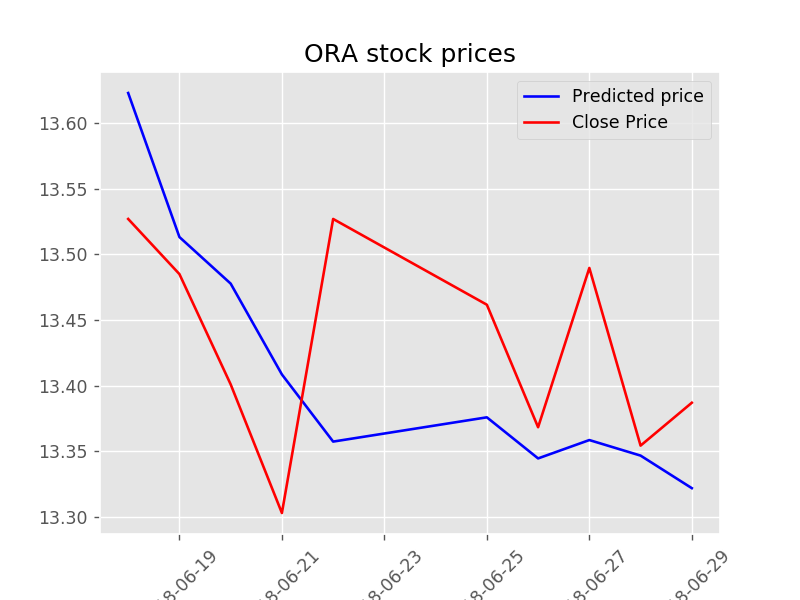

<IPython.core.display.Javascript object>


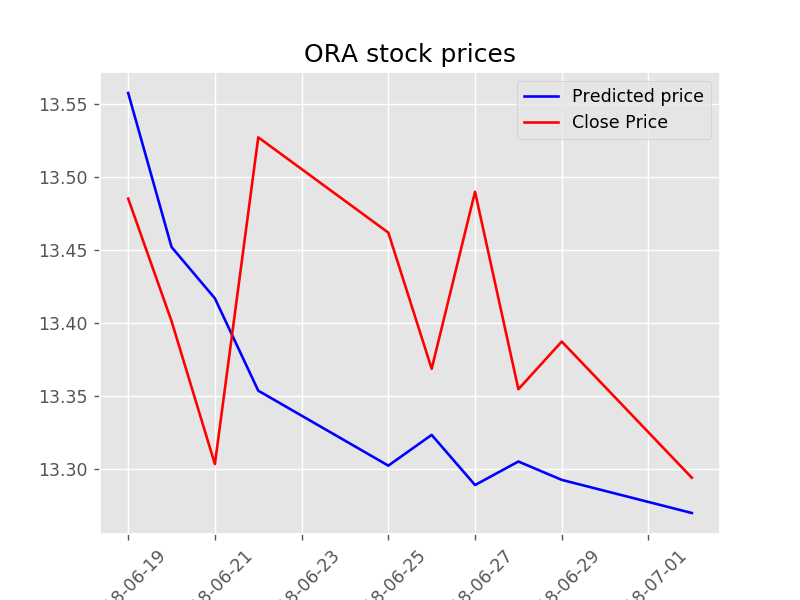

<IPython.core.display.Javascript object>


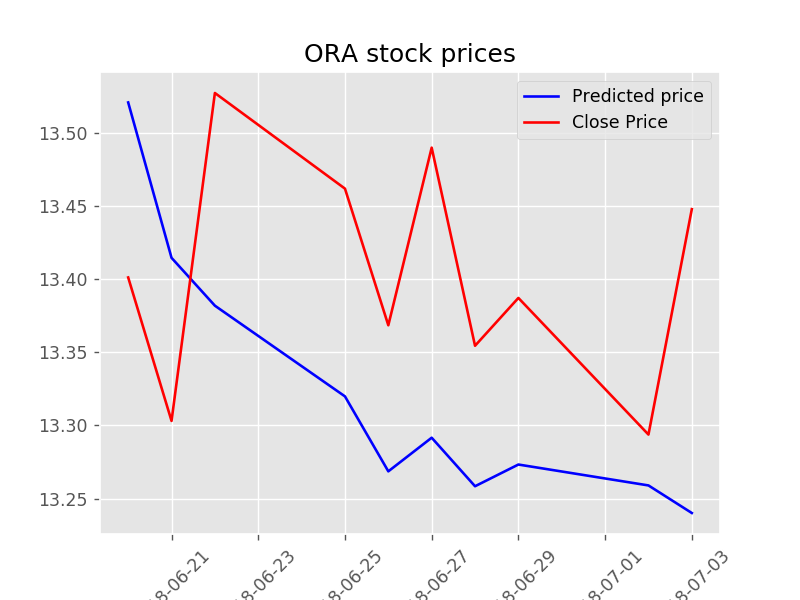

<IPython.core.display.Javascript object>


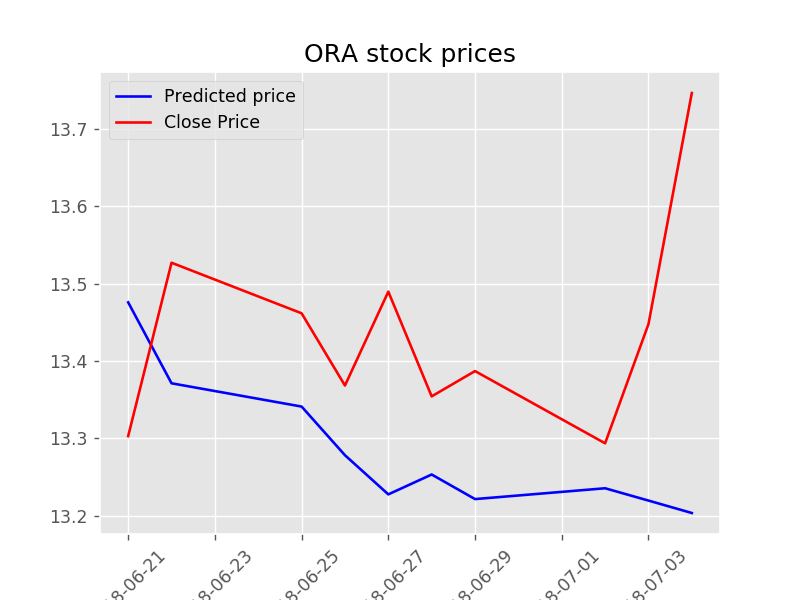

<IPython.core.display.Javascript object>


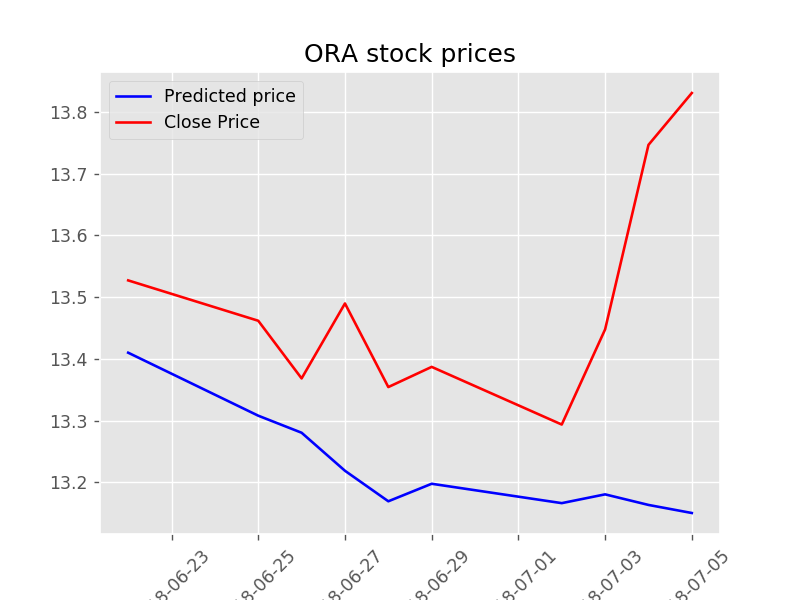

<IPython.core.display.Javascript object>


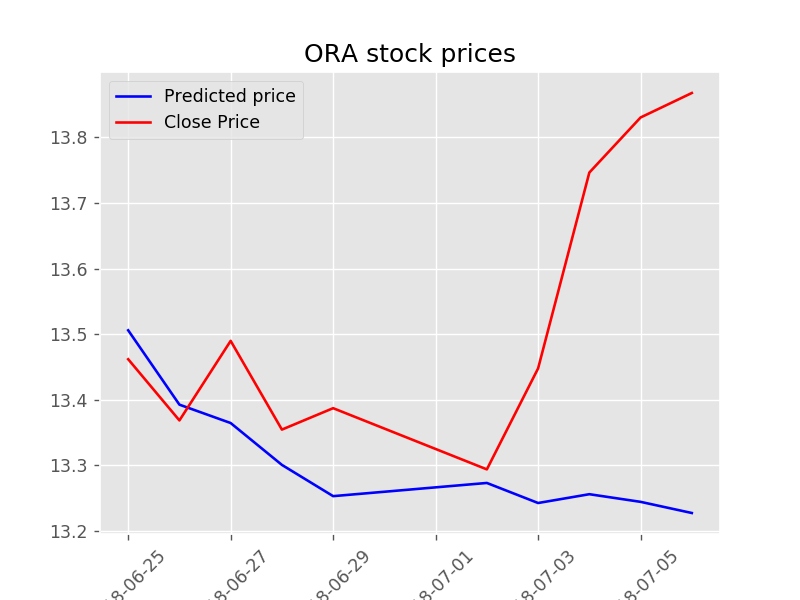

<IPython.core.display.Javascript object>


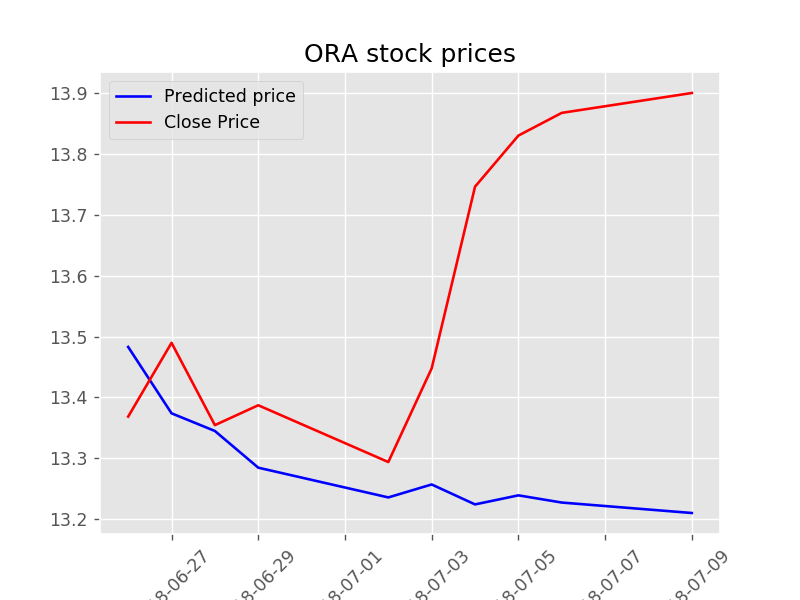

<IPython.core.display.Javascript object>


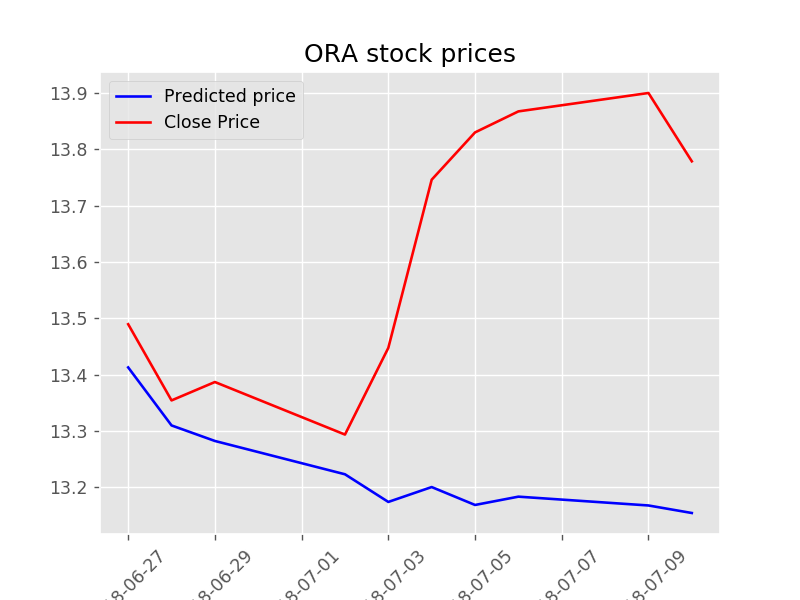

<IPython.core.display.Javascript object>


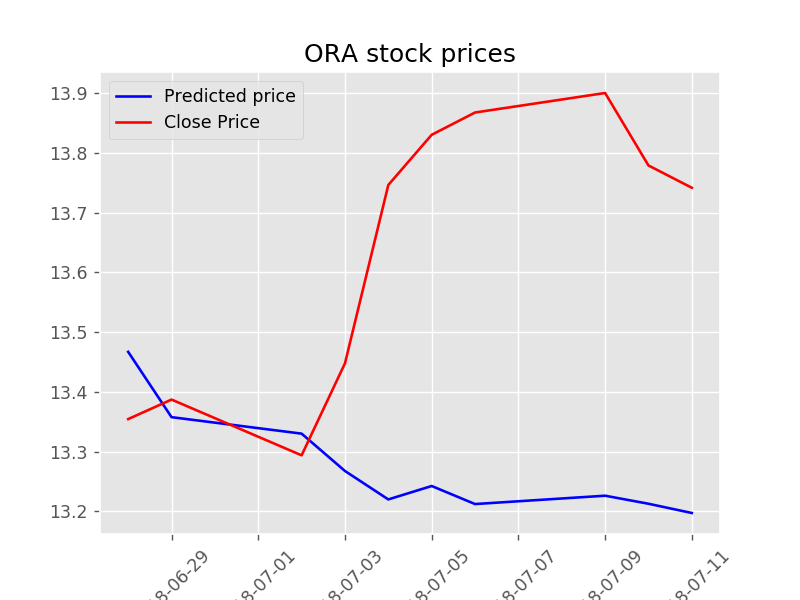

<IPython.core.display.Javascript object>


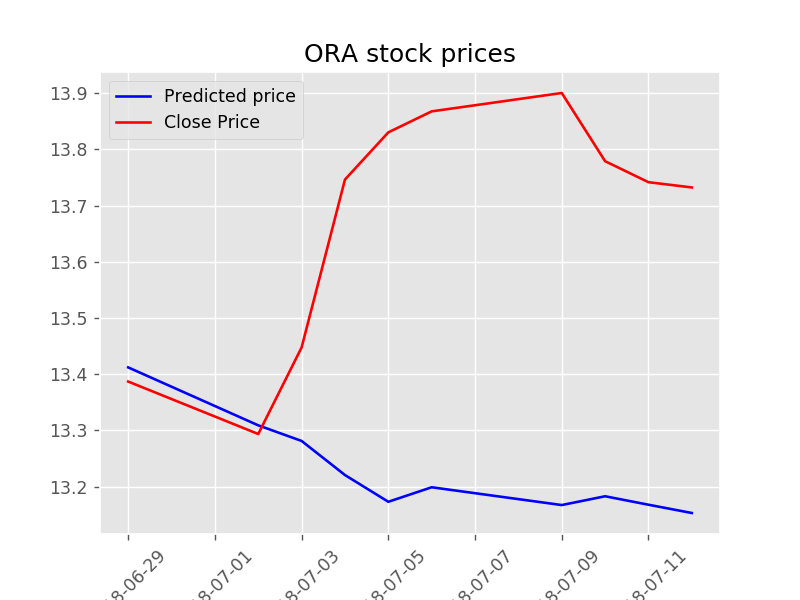

<IPython.core.display.Javascript object>


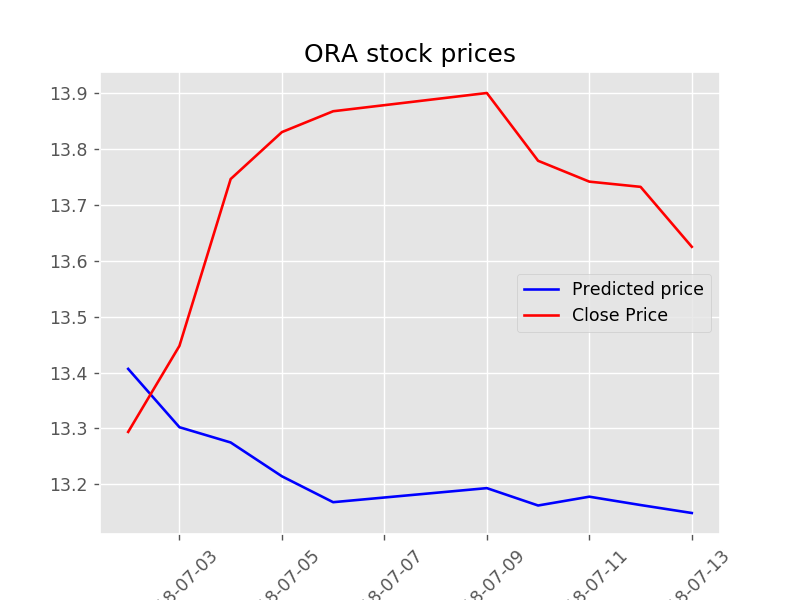

<IPython.core.display.Javascript object>


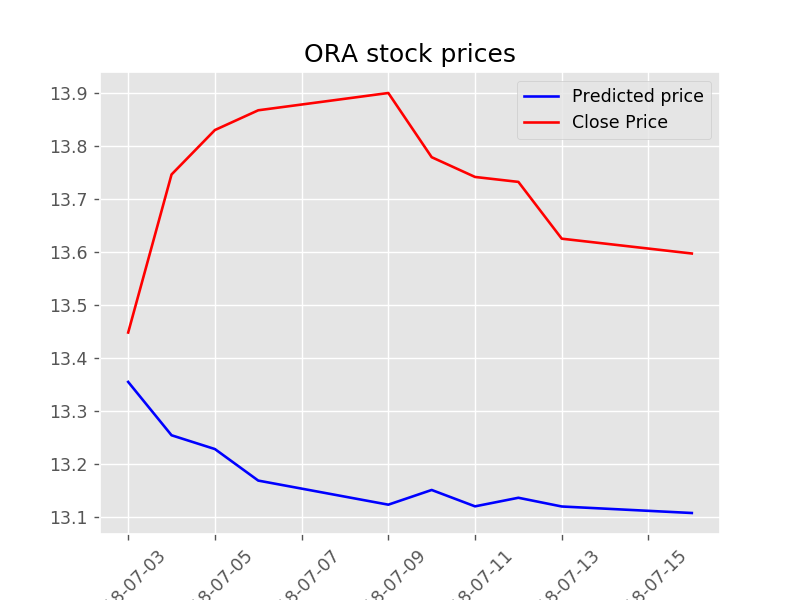

<IPython.core.display.Javascript object>


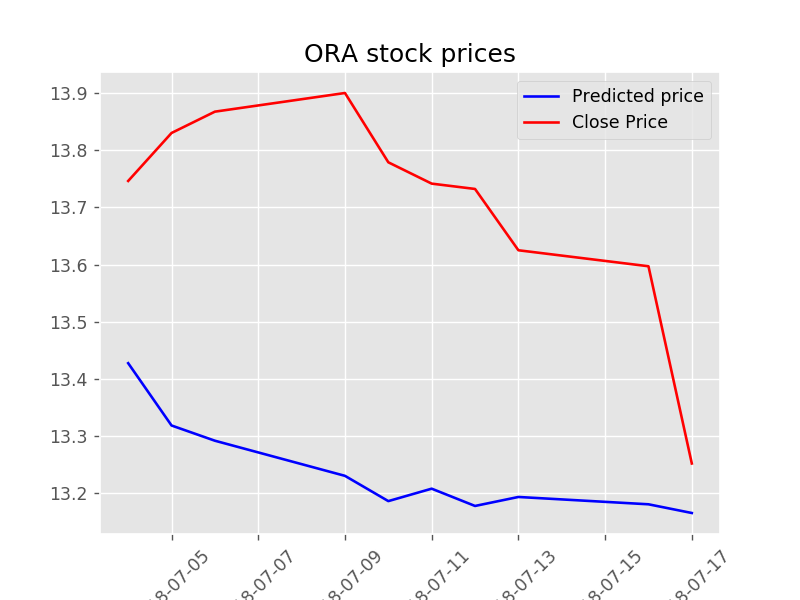

<IPython.core.display.Javascript object>


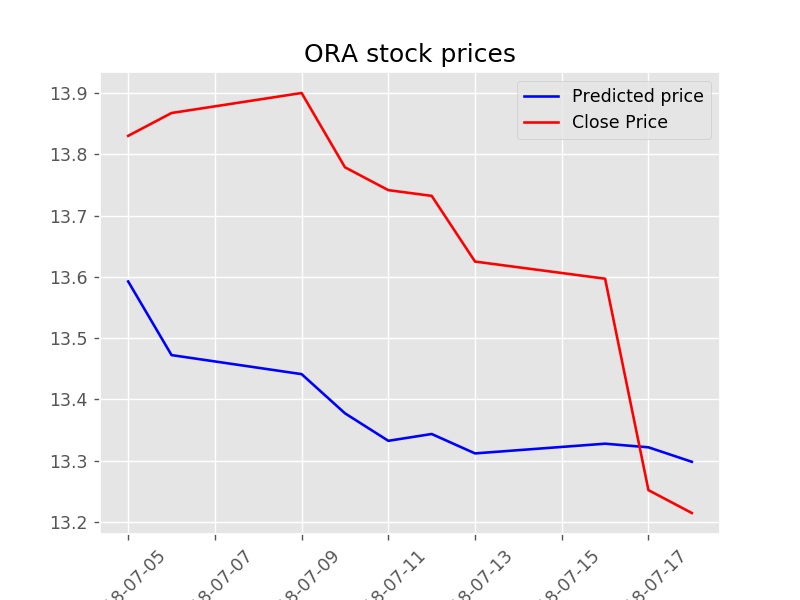

<IPython.core.display.Javascript object>


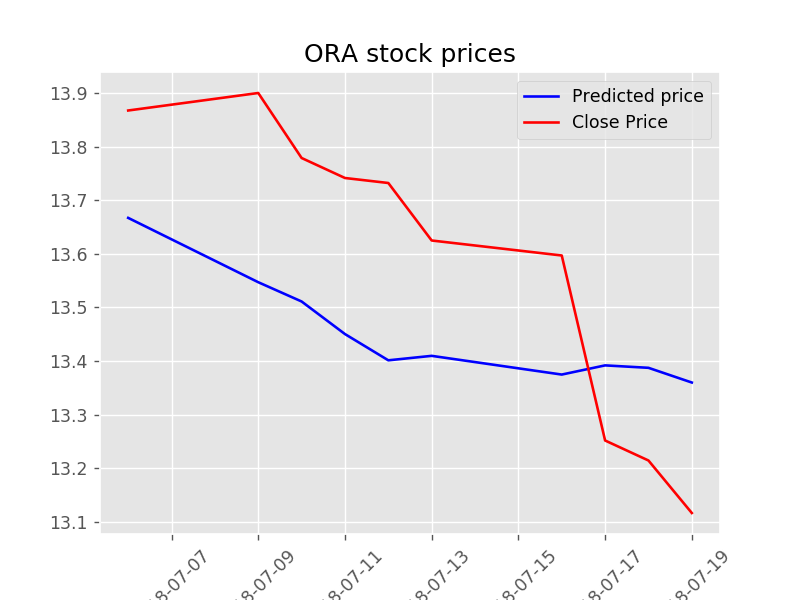

<IPython.core.display.Javascript object>


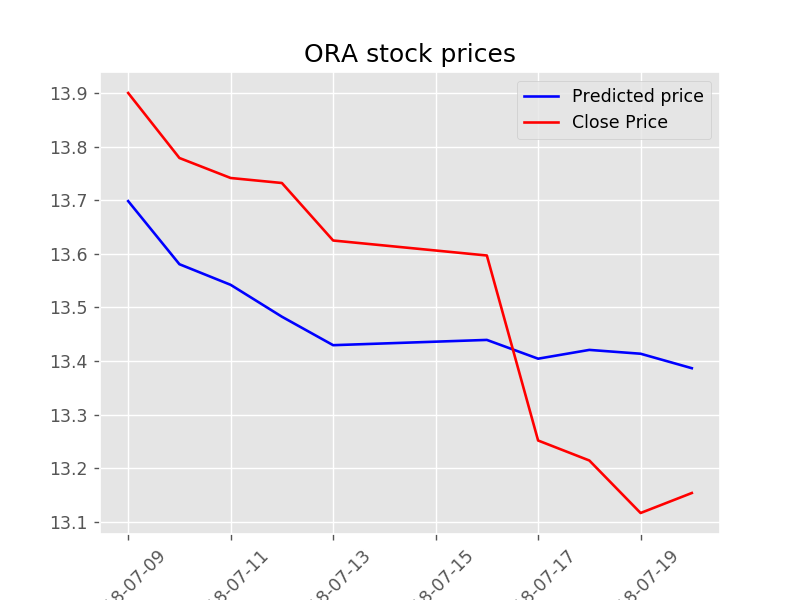

<IPython.core.display.Javascript object>


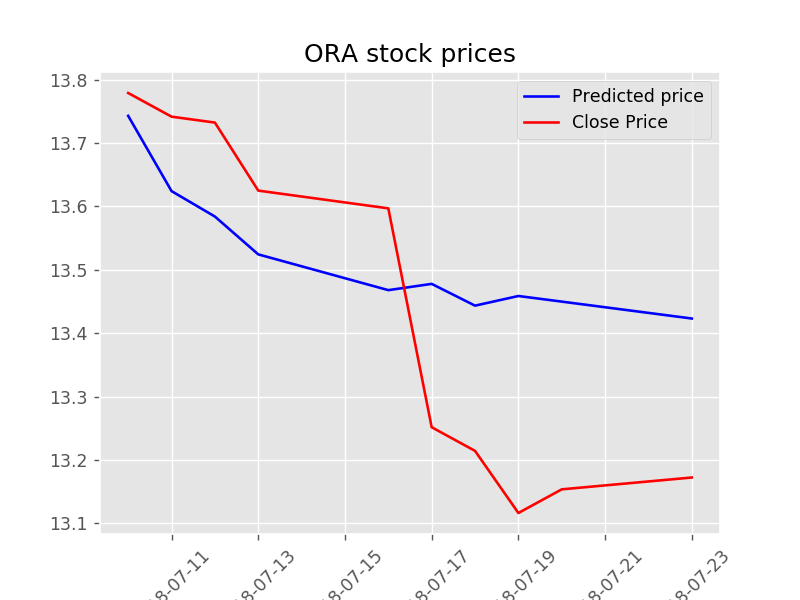

<IPython.core.display.Javascript object>


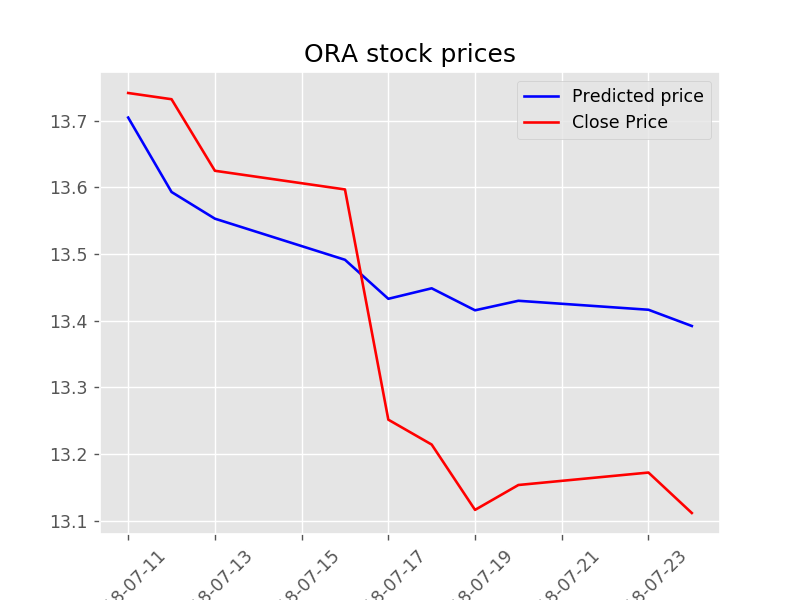

<IPython.core.display.Javascript object>


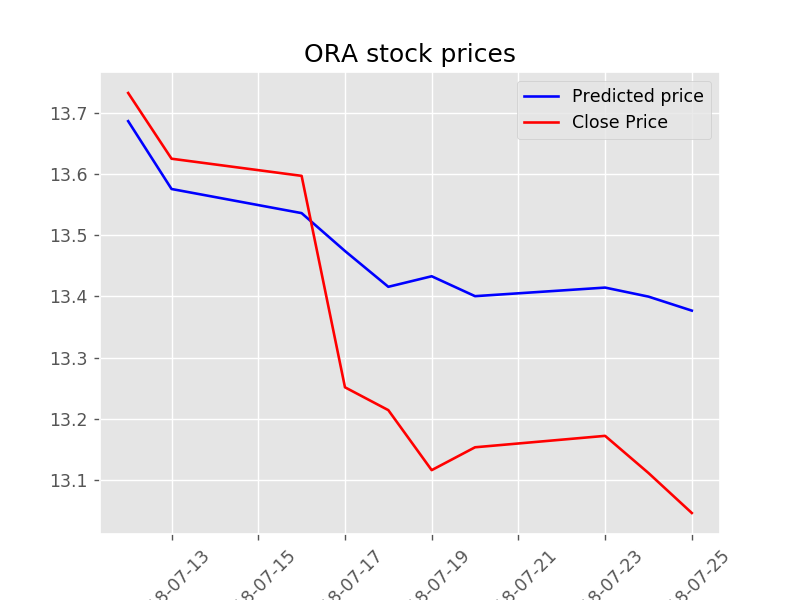

<IPython.core.display.Javascript object>


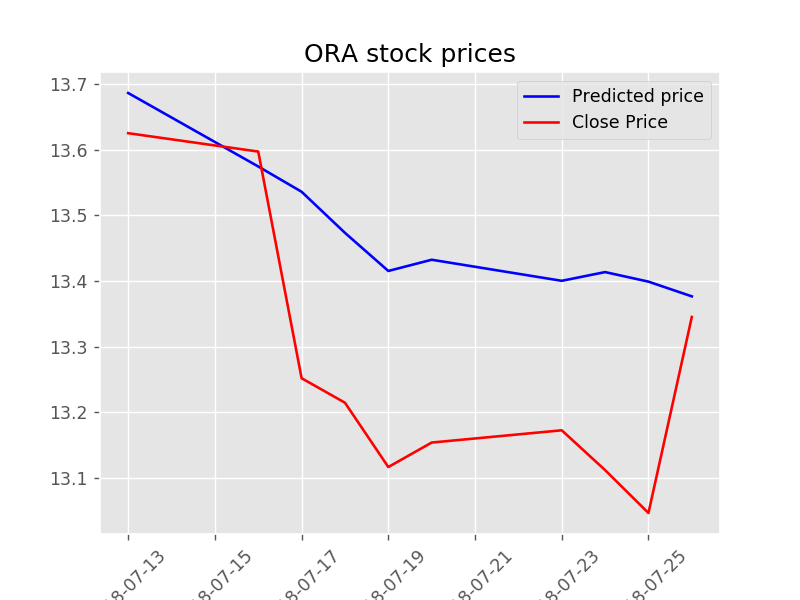

<IPython.core.display.Javascript object>


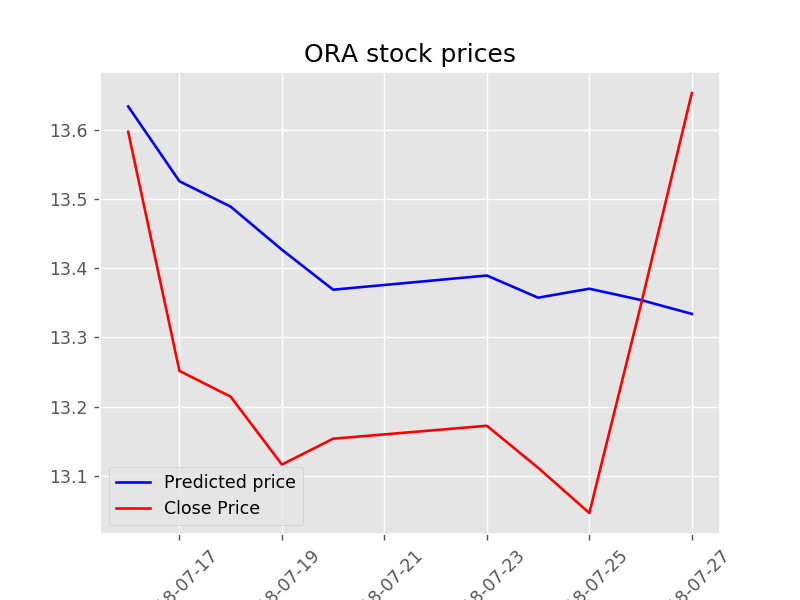

<IPython.core.display.Javascript object>


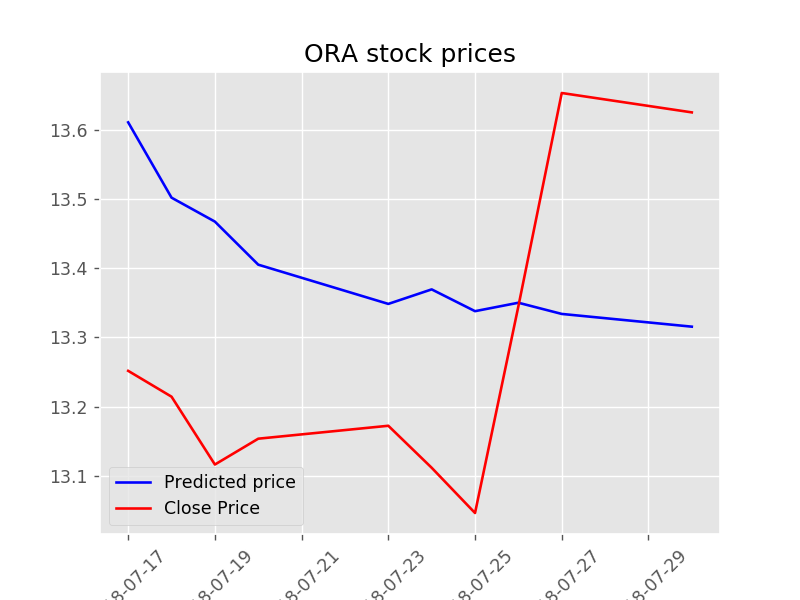

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


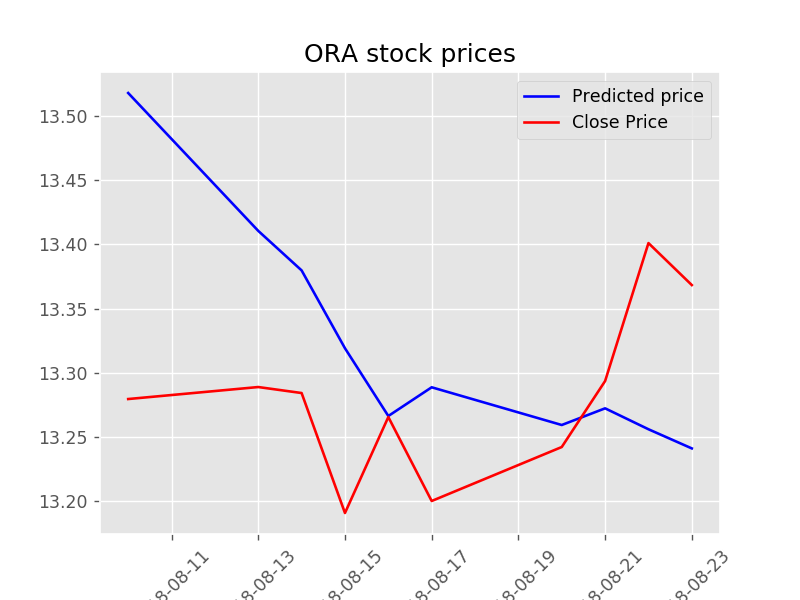

<IPython.core.display.Javascript object>


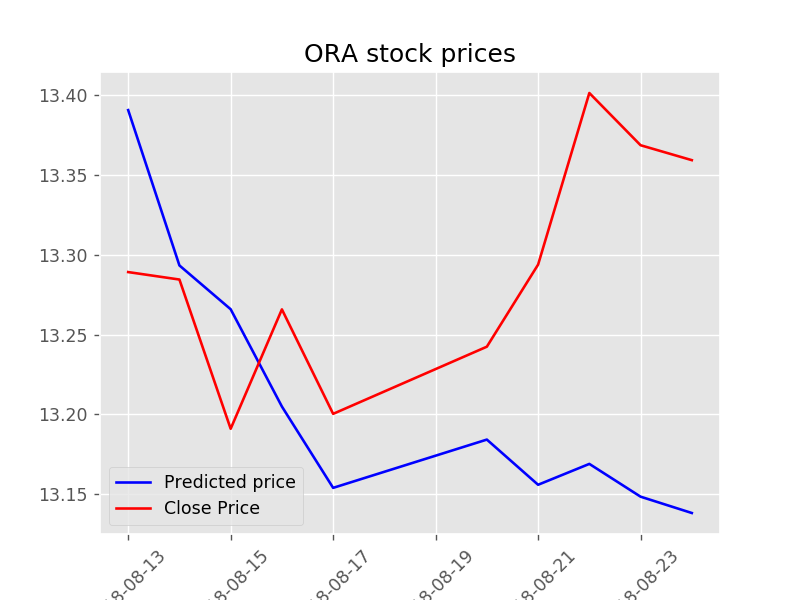

<IPython.core.display.Javascript object>


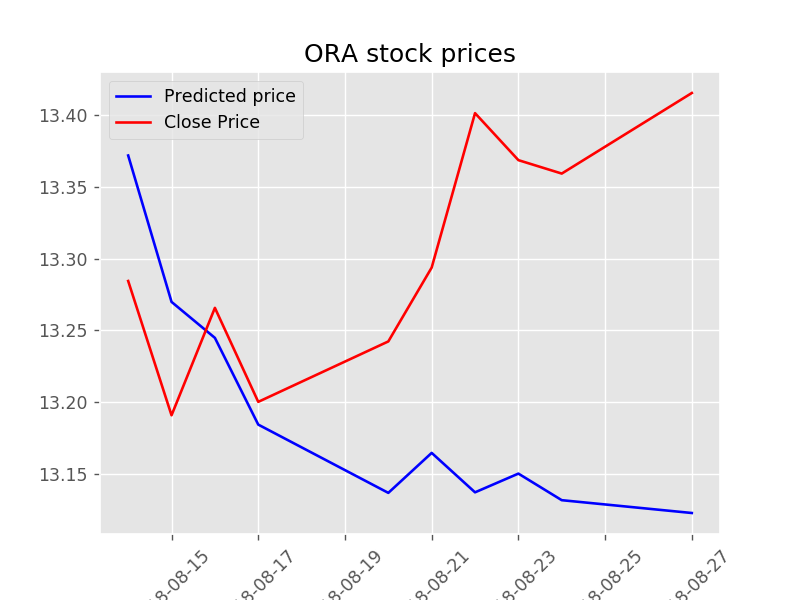

<IPython.core.display.Javascript object>


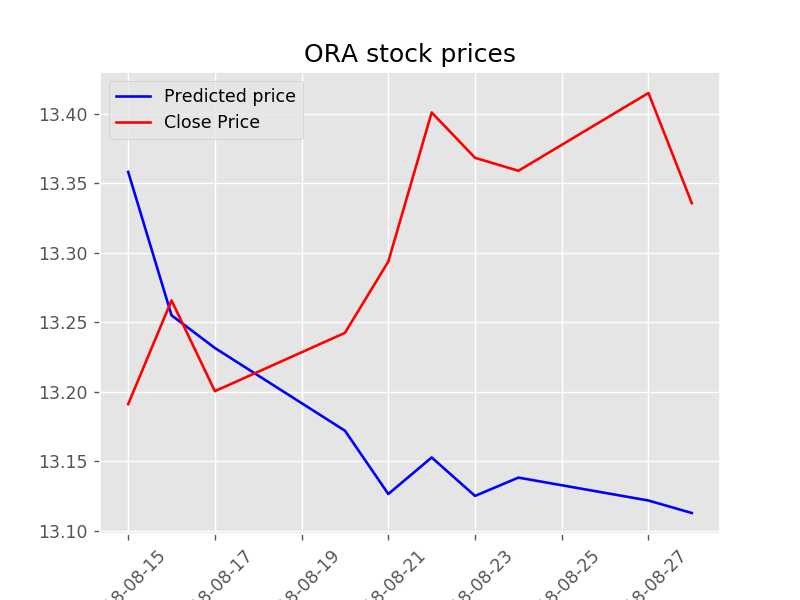

<IPython.core.display.Javascript object>


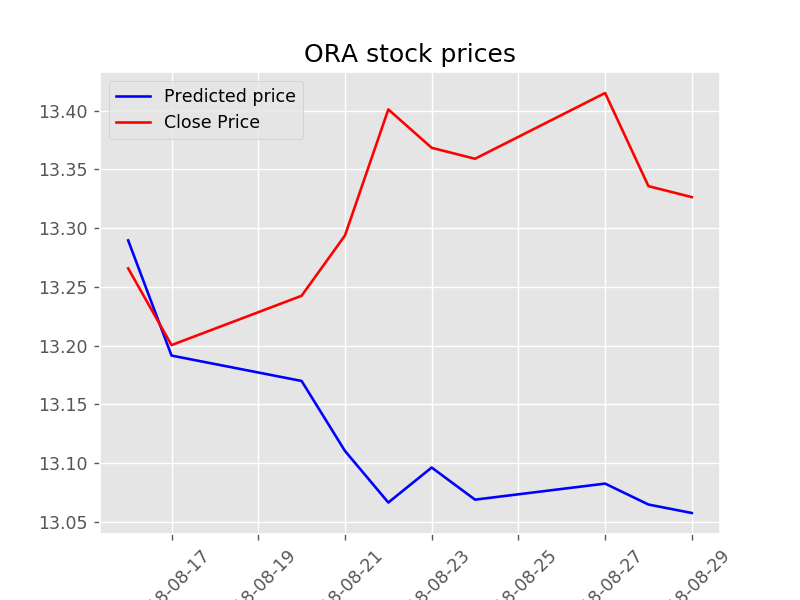

<IPython.core.display.Javascript object>


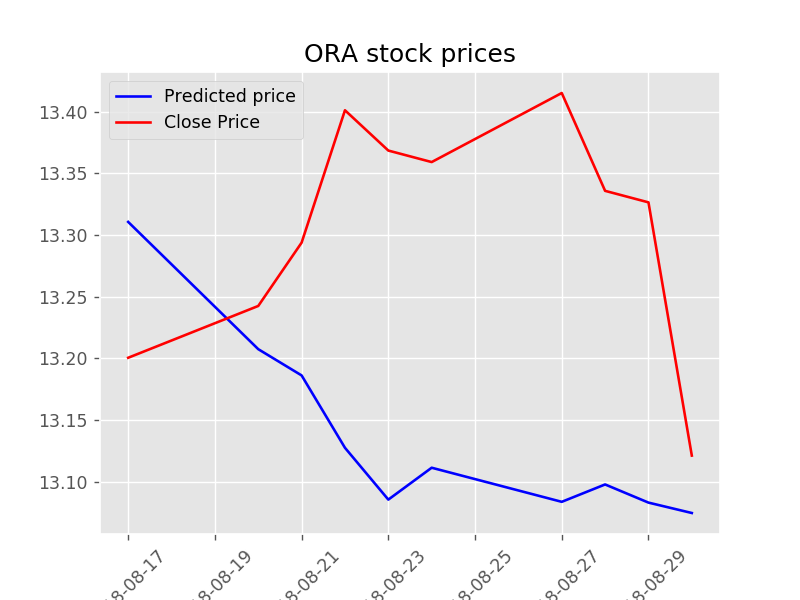

<IPython.core.display.Javascript object>


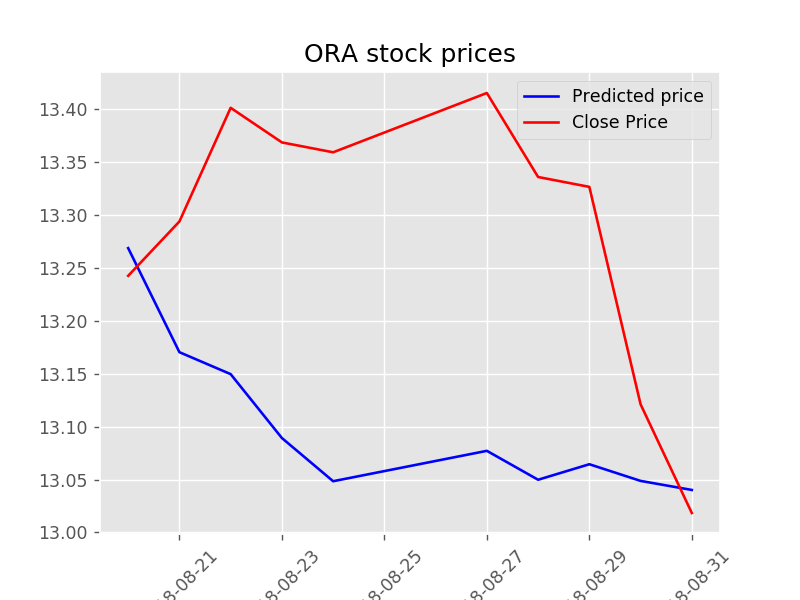

<IPython.core.display.Javascript object>


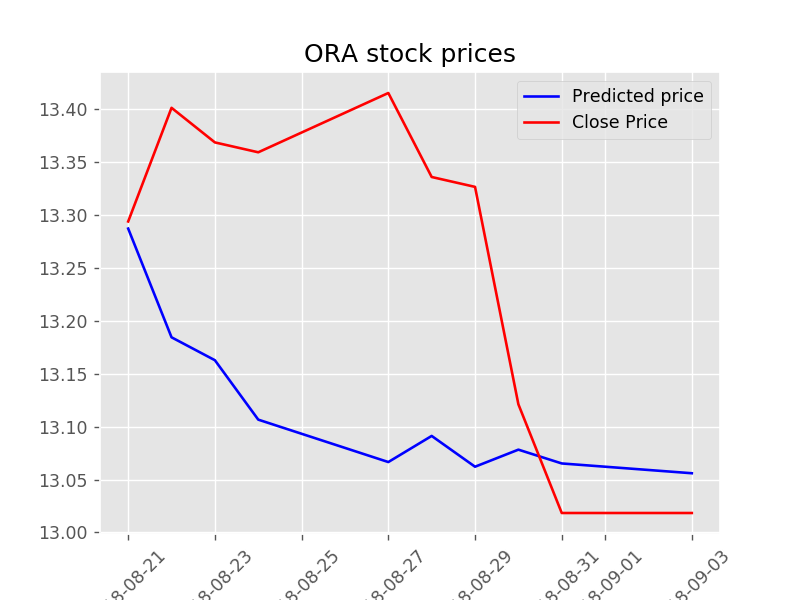

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [35]:
for key in keys:
    for i in range(y_test[key].shape[0]): 
        fig, ax = plot_predicted_price(key, i)
        plt.savefig(img_path + f'\{key}_{i}_predicted_price')